# **Engineering a Kerr-based Deterministic Cubic Phase Gate via Gaussian Operations in Strawberry Fields**

In [3]:
import strawberryfields as sf
from strawberryfields.ops import *

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from tqdm import tqdm

### **Define Useful Functions**

In [4]:
""" Plotting """

def plot_wigner(state, title = "Wigner Function of State", range = 20):
    fig = plt.figure()
    x = np.linspace(-range, range, 100)
    p = np.linspace(-range, range, 100)
    Z = state.wigner(0, x, p)
    X, P = np.meshgrid(x, p)
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_surface(X, P, Z, cmap='RdYlGn', lw=0.5, rstride=1, cstride=1)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('P')
    fig.tight_layout()
    
    plt.show()
    
def ax_plot_wigner(ax, state, title, range=20):
    x = np.linspace(-range, range, 100)
    p = np.linspace(-range, range, 100)
    Z = state.wigner(0, x, p)
    X, P = np.meshgrid(x, p)
    ax.plot_surface(X, P, Z, cmap='RdYlGn', lw=0.5, rstride=1, cstride=1)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('P')
    
# plot  Wigner function on 2D surface
def plot_wigner_2d(state, title = "Wigner Function of State", range = 20):
    fig = plt.figure()
    x = np.linspace(-range, range, 100)
    p = np.linspace(-range, range, 100)
    Z = state.wigner(0, x, p)
    X, P = np.meshgrid(x, p)
    ax = fig.add_subplot(111)
    contour = ax.contourf(X, P, Z, cmap='RdYlGn')
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('P')
    # add colorbar
    cbar = plt.colorbar(contour)
    cbar.set_label('Wigner Function')
    
    fig.tight_layout()
    
    plt.show()
    
def ax_plot_wigner_2d(ax, state, title, range = 20):
    x = np.linspace(-range, range, 100)
    p = np.linspace(-range, range, 100)
    Z = state.wigner(0, x, p)
    X, P = np.meshgrid(x, p)
    contour = ax.contourf(X, P, Z, cmap='RdYlGn')
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('P')
    # add colorbar
    cbar = plt.colorbar(contour)
    cbar.set_label('Wigner Function')
    # set axis to have equal aspect ratio
    ax.set_aspect('equal')
    
def plot_sf_state(state, backend = "fock", cutoff_dim = 40):
    prog = sf.Program(1)
    with prog.context as q:
        state | q[0]
    eng = sf.Engine(backend, backend_options={"cutoff_dim": cutoff_dim})
    result = eng.run(prog)
    plot_wigner(result.state, title = "Wigner Function of State")
    
def plot_kets(simstate, target_state):
    simket = simstate.ket()
    targetket = target_state.ket()

    # plot the real and imaginary parts of the state
    fig = plt.figure(figsize = (12, 5))
    fig.suptitle("Comparison of Simulated and Target States")
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    ax1.plot(np.real(simket), label = "Simulated")
    ax1.plot(np.real(targetket), label = "Target")
    ax1.set_title("Real Part")
    ax2.plot(np.imag(simket), label = "Simulated")
    ax2.plot(np.imag(targetket), label = "Target")
    ax2.set_title("Imaginary Part")
    plt.legend()
    plt.grid()
    plt.show()

""" Other """
def get_fidelity_error(state1, state2, backend = "fock"):
    return 1 - state1.fidelity(other_state = state2.ket(), mode = 0).numpy().item() if backend == "tf" else 1 - state1.fidelity(other_state = state2.ket(), mode = 0)

def get_ket_error(state1, state2):
    return np.linalg.norm(state1.ket() - state2.ket()) # returns L2 norm of difference

def get_wigner_error(state1, state2):
    x = np.linspace(-20, 20, 100)
    p = np.linspace(-20, 20, 100)
    Z1 = state1.wigner(0, x, p)
    Z2 = state2.wigner(0, x, p)
    return np.linalg.norm(Z1 - Z2) # returns L2 norm of wigner difference

### **Define Parameters**


- $\gamma = 0.2$ target gate angle, defines the strength of the cubic phase transformation.

- $\lambda_{dB} = 4$ [dB] squeezing parameter, determines the power gain in the in-phase (x) quadrature.

- $\phi_{\text{sq}} = 0$ squeezing phase, phase of the squeezing transformation.

- $r = |\alpha|$ displacement amplitude along x.

- $\chi$ nonlinearity strength, determines the strength of the Kerr effect.

- $\delta = 3 \chi \alpha^2 - \chi$ detuning, based on the appropriate choice for cubic phase gate.

- $\beta = -2 \chi \alpha^3$ drive strength, based on the appropriate choice for cubic phase gate.

- $\tau = \frac{\sqrt{2} \gamma}{\chi \alpha \lambda^3}$ total gate time, based on the appropriate choice for cubic phase gate.

**Gate parameters** (Special parameters for nonlinear step)

- $\kappa_n = \frac{\chi}{2} \Delta t$ 

- $\phi_{nr} = -\delta \Delta t$ 

- $r_n = \beta \Delta t$
  

**Notes on Squeezing Parameter $\lambda$:**

The paper which this solver is based on essentially uses 3 squeezing parameters (r, $\lambda_{dB}$, and $\lambda$)

When the **squeezing parameter $\lambda_{dB}$** is expressed in **decibels (dB)**, it represents the squeezing level or the reduction in noise (uncertainty) for one quadrature of a quantum state relative to the standard quantum limit (SQL). 

The **squeezing parameter $r$** (the real part of the complex squeezing parameter $z = r e^{i\theta}$) quantifies the amount of squeezing and is related to the squeezing level in dB ($\lambda$) as:

$$
\lambda = -10 \log_{10}(e^{-2r}),
$$

and

$$
r = - \frac{1}{2} \ln(10^{\frac{-\lambda}{10}})
$$

**In-phase quadrature power gain**
*In-phase **power gain** or loss* is given by:
$$
G_X = e^{-2r}.
$$

The in-phase quadrature power gain $G_X$ can be expressed directly in terms of $\lambda_{dB}$:
$$
G_X = 10^{\lambda_{dB} / 10}.
$$

in this paper however, the actual $\lambda$ used is one such that:

$$r = -\ln(\lambda)$$

and 

$$G_X = \lambda^2$$

thus relating $\lambda_{dB}$ and $\lambda$ we get:

$$\lambda = \sqrt{10^{\frac{\lambda_{dB}}{10} }}$$

In [5]:
""" Hyperparameters """
N = 1000 # discretization order
cutoff_dim = 50 # Fock basis truncation
backend = "fock" # backend to use
start_state = sf.ops.GKP([0, 0]) # Vac # sf.ops.Catstate() # sf.ops.Thermal(1) # sf.ops.GKP([0, 0]) # Vac # sf.ops.Catstate()

""" Cubic Phase Gate """
gamma = 0.7 # target gate angle


""" Squeezing """
lamdB = 7 # squeezing level in dB
lam = np.sqrt(10**(lamdB/10)) # squeezing parameter
rsq = -np.log(lam) # squeezing parameter in r form
sqphi  = 0 


""" Displacement """
# convert alpha to polar coordinates
alpha = 4 # displacement amplitude - how much we displace the state along x
rd = np.abs(alpha) # displacement amplitude in r form
phi = 0

""" Nonlinearity """
# medium
chi = 1 # nonlinearity strength

detuning = 3 * chi * alpha**2 - chi # detuning, based on appropriate choice for cubic phase gate
drive = -2 * chi * alpha**3 # drive, based on appropriate choice for cubic phase gate

# gate time
t = np.sqrt(2) * gamma / (chi * alpha * lam**3)
dt = t / N

# parameters for the cubic phase gate step
nkappa = chi/2.0 * dt # for Kerr gate
nkerrr = -chi/2 * dt # rotation for Kerr operator

nrphi = -detuning * dt # for second rotation

nr = drive * dt # magnitude of displacement in nonlinear step
ndphi = 3*np.pi / 2 # direction angle value for displacement in nonlinear step (want e^{î phi_{nd}} to be -i)

print("Lambda: ", lam)
print("Squeezing parameter, r = ", rsq)

Lambda:  2.2387211385683394
Squeezing parameter, r =  -0.8059047825479159


#### **Define Streamlined Function Run**

In [6]:
def simulate_cubic_phase_gate(
    N,
    cutoff_dim,
    backend,
    start_state,
    gamma,
    lamdB,
    alpha,
    chi,
    sqphi=0,
    phi=0,
    ndphi=3 * np.pi / 2
):
    """
    Simulate a cubic phase gate via a sequence of squeezing, displacement, 
    and nonlinear steps, and compare it to the ideal cubic phase gate.

    Parameters:
        N (int): Number of discretization steps.
        cutoff_dim (int): Fock basis truncation dimension.
        backend (str): Backend to use (e.g. "fock").
        start_state: The initial state (e.g. sf.ops.GKP([0,0]), sf.ops.Catstate(), etc.).
        gamma (float): Target gate angle for the cubic phase gate.
        lamdB (float): Squeezing level in dB.
        alpha (float): Displacement amplitude along x.
        chi (float): Nonlinearity strength.
        sqphi (float, optional): Squeezing phase. Default is 0.
        phi (float, optional): Displacement phase. Default is 0.
        ndphi (float, optional): Displacement phase for the nonlinear step. Default is 3π/2.

    Returns:
        tuple: (simstate, target_state)
            simstate: State after applying the approximated cubic phase gate.
            target_state: State after applying the ideal cubic phase gate.
    """
    # Calculate squeezing parameters
    lam = np.sqrt(10 ** (lamdB / 10))
    rsq = -np.log(lam)
    
    # Displacement amplitude in r-form
    rd = np.abs(alpha)
    
    # Calculate detuning and drive for the nonlinear step
    detuning = 3 * chi * alpha**2 - chi
    drive = -2 * chi * alpha**3
    
    # Gate time and time step
    t = np.sqrt(2) * gamma / (chi * alpha * lam**3)
    dt = t / N
    
    # Parameters for the cubic phase gate step
    nkappa = chi / 2.0 * dt
    nrphi = -detuning * dt
    nr = drive * dt
    
    # Build the simulation program (approximate cubic phase gate)
    prog = sf.Program(1)
    with prog.context as q:
        start_state | q[0]
        # Direct operations: squeezing then displacement
        Sgate(rsq, sqphi) | q[0]
        Dgate(rd, phi) | q[0]
        
        # Nonlinear step(s)
        for i in range(N):
            Rgate(-chi / 2 * dt) | q[0]
            Kgate(nkappa) | q[0]
            Rgate(nrphi) | q[0]
            Dgate(nr, ndphi) | q[0]
        
        # Inverse operations: displacement then squeezing
        Dgate(-rd, phi) | q[0]
        Sgate(-rsq, sqphi) | q[0]
    
    eng = sf.Engine(backend, backend_options={"cutoff_dim": cutoff_dim})
    simstate = eng.run(prog).state
    
    # Build the target program (ideal cubic phase gate)
    prog_target = sf.Program(1)
    with prog_target.context as q:
        start_state | q[0]
        Vgate(gamma) | q[0]
    
    eng_target = sf.Engine(backend, backend_options={"cutoff_dim": cutoff_dim})
    target_state = eng_target.run(prog_target).state
    
    return simstate, target_state


print("Time: ", t)

Time:  0.022057335373263535


### **Run Program**

Within the program we implement driven Kerr Hamiltonian
$$
\hat{H}_{\text{Kerr}} = -\frac{\chi}{2} \hat{a}^\dagger{}^2 \hat{a}^2 + \delta \hat{a}^\dagger \hat{a} + \beta (\hat{a} + \hat{a}^\dagger)
$$
and approximate its propagator for a small timestep $dt$ as
$$
\hat{U}_{dt} = e^{-i[-\frac{\chi}{2} \hat{a}^\dagger{}^2 \hat{a}^2 + \delta \hat{a}^\dagger \hat{a} + \beta (\hat{a} + \hat{a}^\dagger)]dt} \approx e^{i\frac{\chi}{2} (\hat{n}^2 - \hat{a}^\dagger \hat{a})dt} e^{-i\delta \hat{a}^\dagger \hat{a}dt} e^{-i\beta (\hat{a} + \hat{a}^\dagger)dt} = K(\frac{\chi}{2}dt)R(-\frac{\chi}{2}dt)R(-\delta dt)D(\beta dt e^{i\frac{3 \pi}{2}})
$$

with
$$
K(\kappa) = \exp\left( i \kappa \hat{n}^2 \right)
$$

$$
R(\phi) = \exp\left( i \phi \hat{a}^\dagger \hat{a} \right)
$$

$$
D(\alpha) = \exp\left( \alpha \hat{a}^\dagger - \alpha^* \hat{a} \right) = \exp\left( r \left( e^{i\phi} \hat{a}^\dagger - e^{-i\phi} \hat{a} \right) \right)
$$










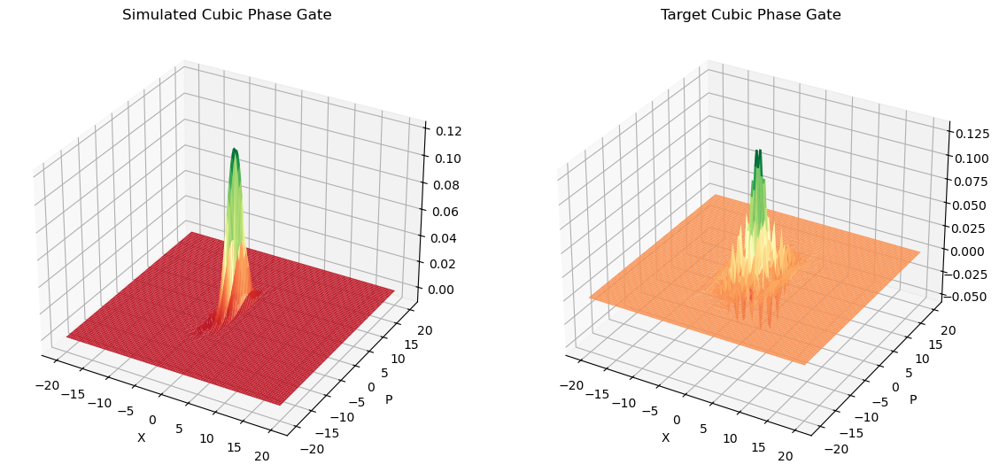

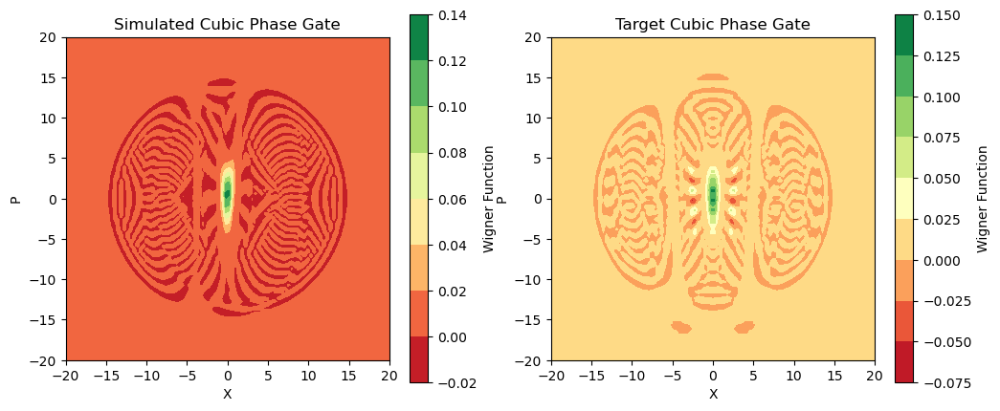

Error =  0.2714730729727163


In [7]:
# set constant parameters
N=3
cutoff_dim = 60 # Fock basistruncation
backend = "fock" # backend to use
gamma = 1.2 # target gate angle
start_state = sf.ops.GKP([0, 0])
lamdB = 11.5
alpha = 2.5
chi = 0.00001 # scales t 
# Run simulation
simstate, target_state = simulate_cubic_phase_gate(
    N, cutoff_dim, backend, start_state, gamma, lamdB, alpha, chi
)

# plot the Wigner function of the simulated and target states
fig = plt.figure(figsize = (14, 7))
ax1 = fig.add_subplot(121, projection='3d')
ax2 = fig.add_subplot(122, projection='3d')
ax_plot_wigner(ax1, simstate, "Simulated Cubic Phase Gate")
ax_plot_wigner(ax2, target_state, "Target Cubic Phase Gate")
plt.show()

# plot 2d Wigner function
fig = plt.figure(figsize = (12, 5))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax_plot_wigner_2d(ax1, simstate, "Simulated Cubic Phase Gate")
ax_plot_wigner_2d(ax2, target_state, "Target Cubic Phase Gate")
plt.show()

print("Error = ", get_fidelity_error(simstate, target_state, backend))

#### **Finding optimal value of alpha for specific $\lambda_{dB}$**


In [ ]:
# set constant parameters
cutoff_dim = 40 # Fock basis truncation
backend = "fock" # backend to use
gamma = 0.7 # target gate angle
start_state = sf.ops.GKP([0, 0])
lamdB = 14
N = 10

def run_program_test(alpha = 0, cutoff_dim = 50):
    
    # Run simulation
    simstate, target_state = simulate_cubic_phase_gate(
        N, cutoff_dim, backend, start_state, gamma, lamdB, alpha, chi
    )
    
    """ Return Error """
    error = get_fidelity_error(simstate, target_state, backend)
    return np.log(np.abs(error))

100%|██████████| 5/5 [00:02<00:00,  1.83it/s]


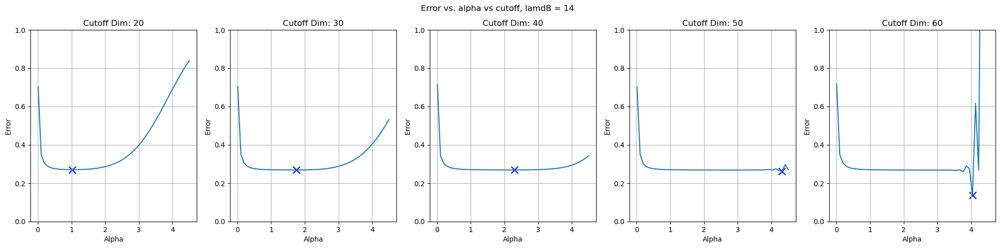

In [ ]:
discret = 50
alphas = np.linspace(0.01, 4.5, discret)
cutoff_dims = range(20, 70, 10)
min_errors = [] # list of min errors for each cutoff dim
min_alphas = [] # list of min alphas for each cutoff dim
errors = [] # lists of errors for each run


for cutoff_dim in tqdm(cutoff_dims):
    error = []
    for alpha in alphas:
        error.append(run_program_test(alpha, cutoff_dim))
        
    min_index = np.argmin(error)
    min_alpha = alphas[min_index]
        
    # save results
    min_alphas.append(min_alpha)
    min_errors.append(error[min_index])
    errors.append(error)
        
# plot the results with 5 columns and 1 row
fig, axs = plt.subplots(1, len(cutoff_dims), figsize=(25, 5))

fig.suptitle("Error vs. alpha vs cutoff, lamdB = {}".format(lamdB))
for i, cutoff_dim in enumerate(cutoff_dims):
    axs[i].plot(alphas, errors[i])
    axs[i].scatter(min_alphas[i], min_errors[i], color = "b", marker = "x", s = 100)
    axs[i].set_title(f"Cutoff Dim: {cutoff_dim}")
    axs[i].set_xlabel("Alpha")
    axs[i].set_ylabel("Log Error")
    axs[i].grid()
    # set axis y limits
    axs[i].set_ylim(-2, 0)


plt.savefig("error_vs_alpha/error_vs_alpha_vs_cutoff_lam{}.png".format(lamdB))
plt.show()


#### **Test alternative error definitions**

In [9]:
# set constant parameters
cutoff_dim = 40 # Fock basis truncation
backend = "fock" # backend to use
gamma = 0.7 # target gate angle
start_state = sf.ops.GKP([0, 0])
lamdB = 14
N = 10

def run_program_ket(alpha = 0, cutoff_dim = 50):
    
    # Run simulation
    simstate, target_state = simulate_cubic_phase_gate(
        N, cutoff_dim, backend, start_state, gamma, lamdB, alpha, chi
    )
    
    """ Return Error """
    error = get_ket_error(simstate, target_state)
    return np.log(np.abs(error))

def run_program_wigner(alpha = 0, cutoff_dim = 50):
    
    # Run simulation
    simstate, target_state = simulate_cubic_phase_gate(
        N, cutoff_dim, backend, start_state, gamma, lamdB, alpha, chi
    )
    
    """ Return Error """
    error = get_wigner_error(simstate, target_state)
    return np.log(np.abs(error))

100%|██████████| 5/5 [00:00<00:00,  6.18it/s]


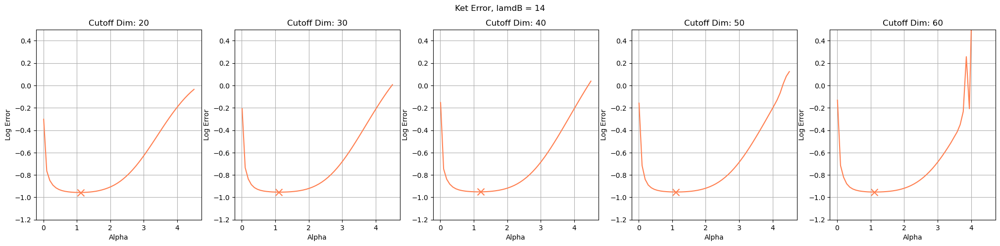

100%|██████████| 5/5 [00:51<00:00, 10.37s/it]


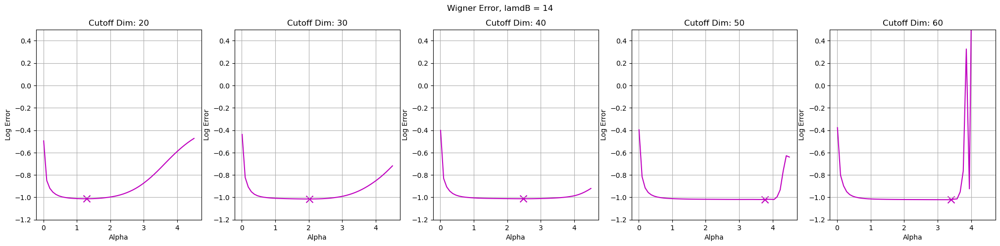

In [12]:
discret = 50
alphas = np.linspace(0.01, 4.5, discret)
cutoff_dims = range(20, 70, 10)
min_errors = [] # list of min errors for each cutoff dim
min_alphas = [] # list of min alphas for each cutoff dim
errors = [] # lists of errors for each run

""" ket error """
for cutoff_dim in tqdm(cutoff_dims):
    error = []
    for alpha in alphas:
        error.append(run_program_ket(alpha, cutoff_dim))
        
    min_index = np.argmin(error)
    min_alpha = alphas[min_index]
        
    # save results
    min_alphas.append(min_alpha)
    min_errors.append(error[min_index])
    errors.append(error)
        
# plot the results with 5 columns and 1 row
fig, axs = plt.subplots(1, len(cutoff_dims), figsize=(25, 5))

fig.suptitle("Ket Error, lamdB = {}".format(lamdB))
for i, cutoff_dim in enumerate(cutoff_dims):
    axs[i].plot(alphas, errors[i], color = "coral")
    axs[i].scatter(min_alphas[i], min_errors[i], color = "coral", marker = "x", s = 100)
    axs[i].set_title(f"Cutoff Dim: {cutoff_dim}")
    axs[i].set_xlabel("Alpha")
    axs[i].set_ylabel("Log Error")
    axs[i].grid()
    # set axis y limits
    axs[i].set_ylim(-1.2, 0.5)


plt.savefig("new_error/ket_error_vs_alpha_vs_cutoff_lam{}.png".format(lamdB))
plt.show()


""" wigner error """
min_errors = [] # list of min errors for each cutoff dim
min_alphas = [] # list of min alphas for each cutoff dim
errors = [] # lists of errors for each run


for cutoff_dim in tqdm(cutoff_dims):
    error = []
    for alpha in alphas:
        error.append(run_program_wigner(alpha, cutoff_dim))
        
    min_index = np.argmin(error)
    min_alpha = alphas[min_index]
        
    # save results
    min_alphas.append(min_alpha)
    min_errors.append(error[min_index])
    errors.append(error)
        
# plot the results with 5 columns and 1 row
fig, axs = plt.subplots(1, len(cutoff_dims), figsize=(25, 5))

fig.suptitle("Wigner Error, lamdB = {}".format(lamdB))
for i, cutoff_dim in enumerate(cutoff_dims):
    axs[i].plot(alphas, errors[i], color = "m")
    axs[i].scatter(min_alphas[i], min_errors[i], color = "m", marker = "x", s = 100)
    axs[i].set_title(f"Cutoff Dim: {cutoff_dim}")
    axs[i].set_xlabel("Alpha")
    axs[i].set_ylabel("Log Error")
    axs[i].grid()
    # set axis y limits
    axs[i].set_ylim(-1.2, 0.5)


plt.savefig("new_error/wigner_error_vs_alpha_vs_cutoff_lam{}.png".format(lamdB))
plt.show()


#### **Finding optimal values of alpha**


In [ ]:
# set constant parameters
cutoff_dim = 40 # Fock basis truncation
backend = "fock" # backend to use
gamma = 0.7 # target gate angle
start_state = Vac # sf.ops.GKP([0, 0])
N = 10

def run_program_alpha(lamdB = 0, alpha = 0):
    
    # Run simulation
    simstate, target_state = simulate_cubic_phase_gate(
        N, cutoff_dim, backend, start_state, gamma, lamdB, alpha, chi
    )
    
    """ Return Error """
    error = get_ket_error(simstate, target_state)
    return np.log(np.abs(error))

Run tests for $\alpha$ and $\lambda$

100%|██████████| 15/15 [03:17<00:00, 13.15s/it]


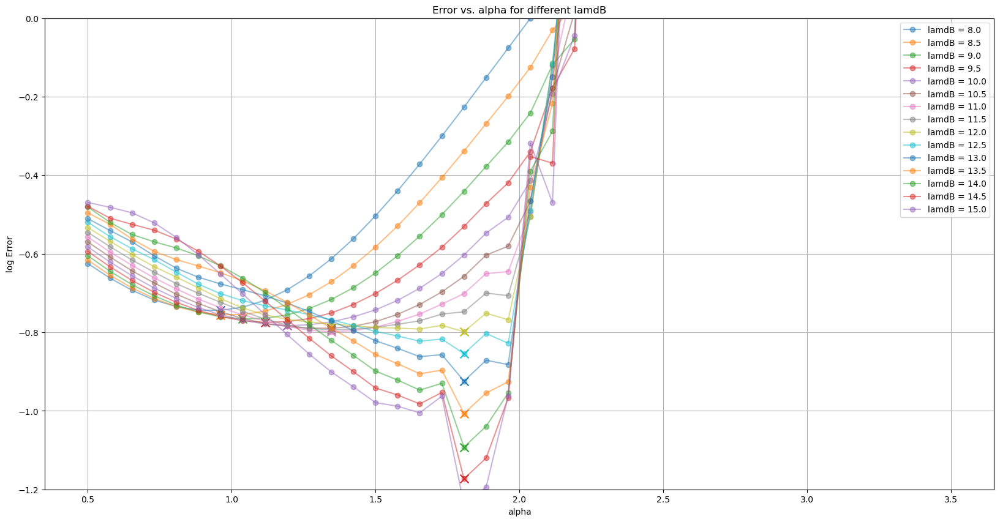

In [103]:

discret = 40
lamdBs = np.linspace(8, 15, 15)
alphas = np.linspace(0.5, 3.5, discret)

min_alphas = []

figure = plt.figure(figsize = (20, 10))

for i, lamdB in tqdm(enumerate(lamdBs), total = len(lamdBs)):
    errors = []
    for alpha in alphas:
        errors.append(run_program_alpha(lamdB = lamdB, alpha = alpha))
    
    # retrieve minimum error index and corresponding alpha
    min_index = np.argmin(errors)
    min_alpha = alphas[min_index]
    min_alphas.append(min_alpha)
    
    # plot
    plt.plot(alphas, errors, color = "C{}".format(i), label = "lamdB = " + str(lamdB), alpha = 0.5, marker = "o")
    plt.scatter(min_alpha, errors[min_index], color = "C{}".format(i), marker = "x", s = 100)
plt.xlabel("alpha")
plt.ylabel("log Error")
plt.ylim(-1.2, 0)
plt.grid()
plt.title("Error vs. alpha for different lamdB")
plt.legend()
plt.savefig("error_vs_alpha_vacuum.png")
plt.show()

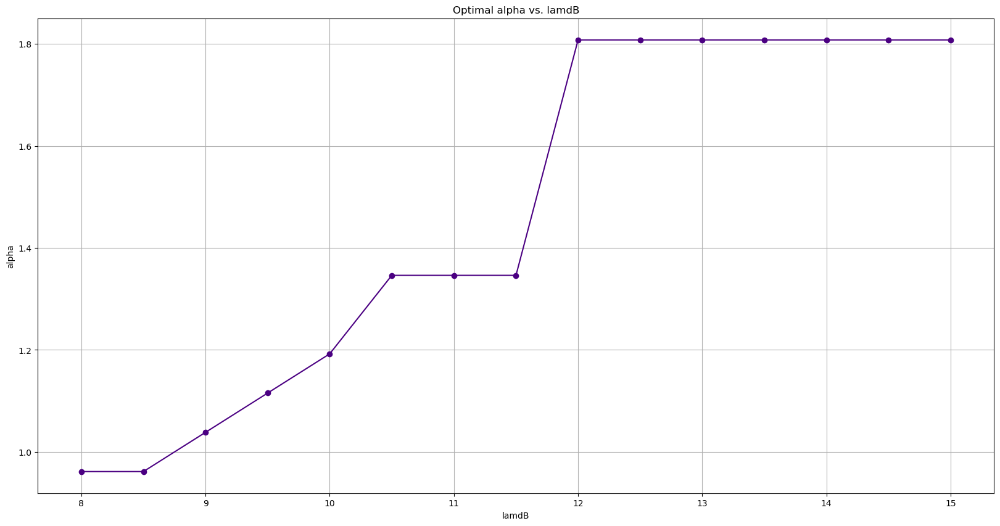

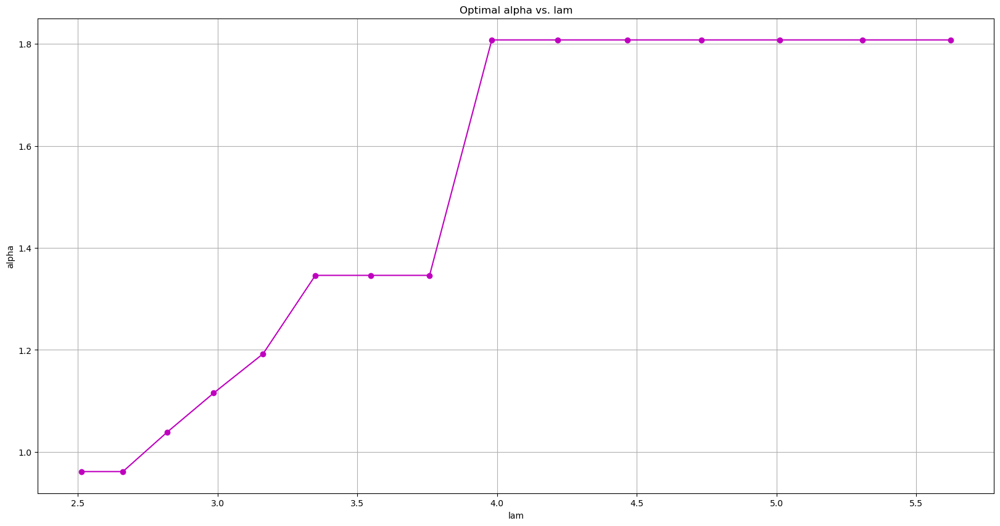

In [104]:
# plot min alpha vs. lamdB
figure = plt.figure(figsize = (20, 10))
plt.plot(lamdBs, min_alphas, marker = "o", color = 'indigo')
plt.xlabel("lamdB")
plt.ylabel("alpha")
plt.title("Optimal alpha vs. lamdB")
plt.grid()
# plt.savefig("optimal_alpha_vs_lamdB.png")

# plot min alpha vs. lam
lams = np.sqrt(10 ** (lamdBs / 10)) # get lams
figure = plt.figure(figsize = (20, 10))
plt.plot(lams, min_alphas, marker = "o", color = 'm')
plt.xlabel("lam")
plt.ylabel("alpha")
plt.title("Optimal alpha vs. lam")
plt.grid()


We expect alphas to $\alpha \propto \lambda^3$. This is not what we observe.

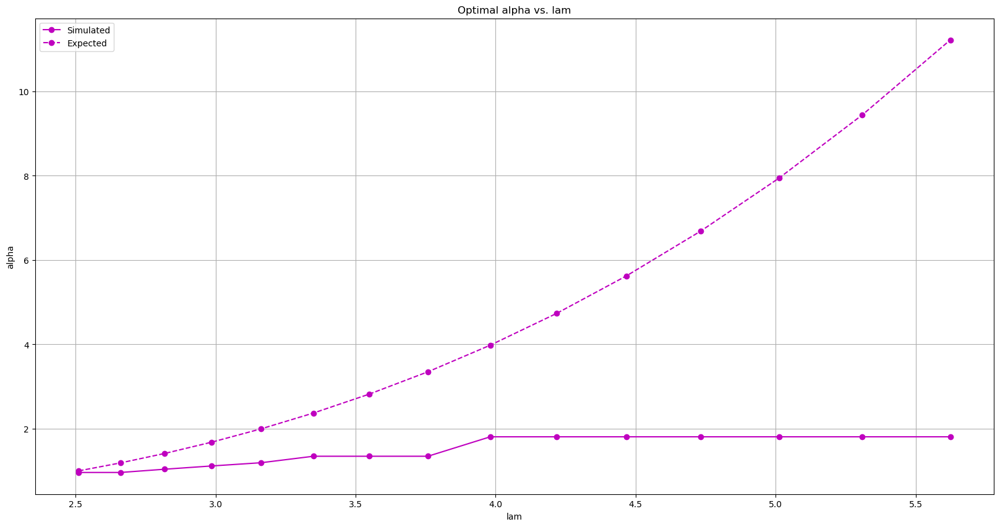

In [105]:
# plot min alpha vs. lam

C = alphas[0] / (alphas[0] * lams[0]**3)

alphas_expect = C * lams**3
figure = plt.figure(figsize = (20, 10))
plt.plot(lams, min_alphas, marker = "o", color = 'm', label = "Simulated")
plt.plot(lams, alphas_expect, marker = "o", color = 'm', linestyle = "--", label = "Expected")
plt.xlabel("lam")
plt.ylabel("alpha")
plt.legend()
plt.title("Optimal alpha vs. lam")
plt.grid()

#### **Reviewing Effect of N**



In [98]:
# set constant parameters
cutoff_dim = 50 # Fock basis truncation
backend = "fock" # backend to use
gamma = 0.7 # target gate angle
start_state = sf.ops.GKP([0, 0]) # Vac
lamdB = 12
alpha = 1.5
chi = 0.001 # scales t 

def run_program_N(N):
    
    simstate, target_state = simulate_cubic_phase_gate(
        N, cutoff_dim, backend, start_state, gamma, lamdB, alpha, chi
    )
    
    """ Return Error """
    error = get_ket_error(simstate, target_state)
    return np.log(np.abs(error))

In [53]:
""" Run the test """
Ns = range(1, 100, 1)

errors = []
for i, N in tqdm(enumerate(Ns), total = len(Ns)):    
    errors.append(run_program_N(N))

100%|██████████| 99/99 [00:01<00:00, 86.36it/s] 


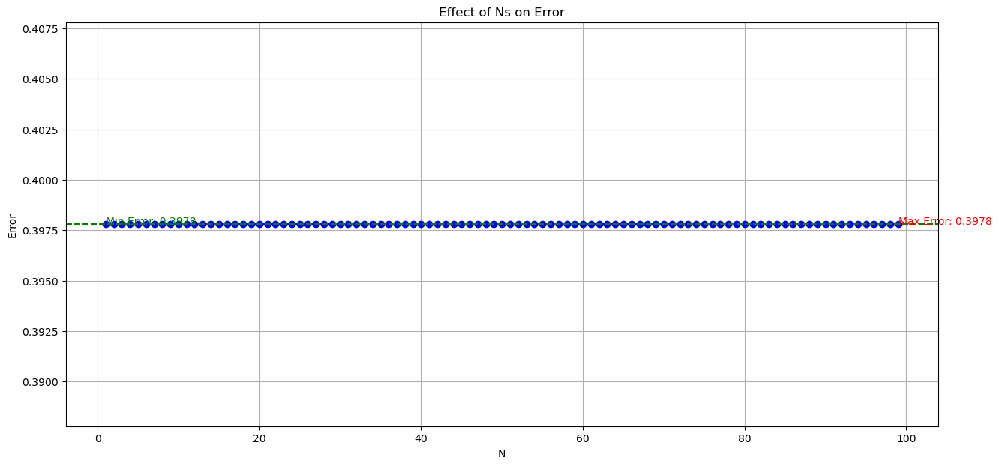

In [55]:
experrors = [np.exp(error) for error in errors] # convert back to error and not log error
figure = plt.figure(figsize=(15, 7))
plt.plot(Ns, experrors, marker = 'o', color = 'blue')
plt.title("Effect of Ns on Error")
plt.xlabel('N')
plt.ylabel('Error')
# plot max error and min error
plt.axhline(y = np.max(experrors), color = 'r', linestyle = '--', label = "Max Error")
plt.axhline(y = np.min(experrors), color = 'g', linestyle = '--', label = "Min Error")
# add label with max and min error
plt.text(Ns[np.argmax(experrors)], np.max(experrors), "Max Error: {:.4f}".format(np.max(experrors)), color = 'red')
plt.text(Ns[np.argmin(experrors)], np.min(experrors), "Min Error: {:.4f}".format(np.min(experrors)), color = 'green')   
plt.ylim(np.min(experrors) - 0.01, np.max(experrors) + 0.01)
plt.grid()
plt.savefig("error_vs_N (state={},bkend={},cf={},alpha={},lamdB={}).png".format('gkp', backend, cutoff_dim, alpha, lamdB))

### **Testing**

#### **Plotting Each Step**

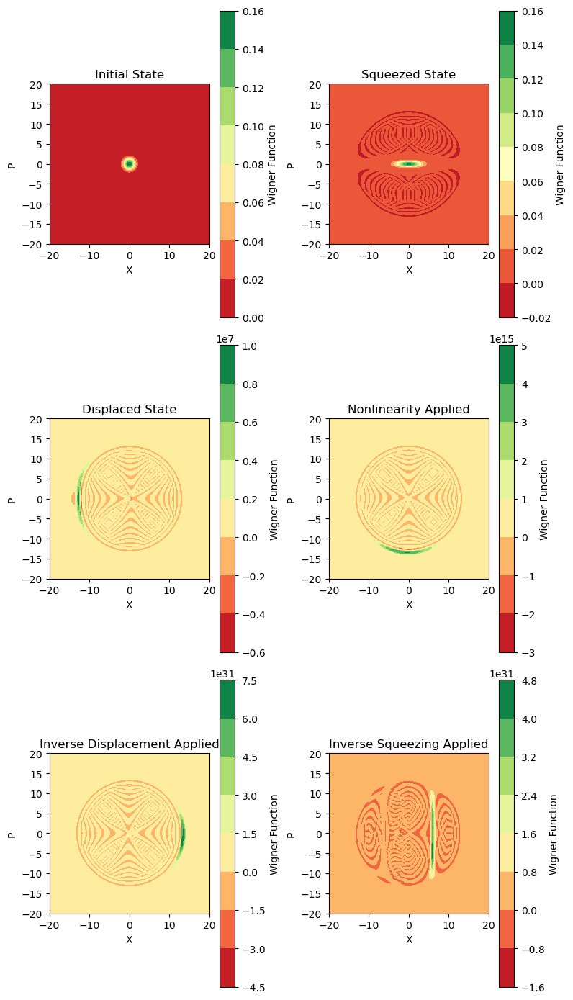

In [29]:

# initial
prog = sf.Program(1)
with prog.context as q:
    start_state | q[0] # prepare the start_stateuum state |0>
    
eng = sf.Engine(backend, backend_options={"cutoff_dim": cutoff_dim}) 
state0 = eng.run(prog).state   
 
# squeezed
prog = sf.Program(1)
with prog.context as q:
    start_state | q[0] # prepare the start_stateuum state |0>

    """ Direct """
    Sgate(-np.log(lam), sqphi) | q[0] # apply the squeezing

eng = sf.Engine(backend, backend_options={"cutoff_dim": cutoff_dim}) 
state1 = eng.run(prog).state

# displaced
prog = sf.Program(1)
with prog.context as q:
    start_state | q[0] # prepare the start_stateuum state |0>

    """ Direct """
    Sgate(-np.log(lam), sqphi) | q[0] # apply the squeezing
    Dgate(rd, phi) | q[0] # apply the displacement

eng = sf.Engine(backend, backend_options={"cutoff_dim": cutoff_dim}) 
state2 = eng.run(prog).state
 
# nonlinearity
prog = sf.Program(1)
with prog.context as q:
    start_state | q[0] # prepare the start_stateuum state |0>

    """ Direct """
    Sgate(-np.log(lam), sqphi) | q[0] # apply the squeezing
    Dgate(rd, phi) | q[0] # apply the displacement
    
    """ Nonlinearity """
    for i in range(N): # apply the small propagation step N times
        Rgate(-chi/2*dt) | q[0]
        Kgate(nkappa) | q[0]
        Rgate(nrphi) | q[0]
        Dgate(nr, ndphi) | q[0]
        
eng = sf.Engine(backend, backend_options={"cutoff_dim": cutoff_dim})
state3 = eng.run(prog).state

# inverse displacement
prog = sf.Program(1)
with prog.context as q:
    start_state | q[0] # prepare the start_stateuum state |0>

    """ Direct """
    Sgate(-np.log(lam), sqphi) | q[0] # apply the squeezing
    Dgate(rd, phi) | q[0] # apply the displacement
    
    """ Nonlinearity """
    for i in range(N): # apply the small propagation step N times
        Rgate(-chi/2*dt) | q[0]
        Kgate(nkappa) | q[0]
        Rgate(nrphi) | q[0]
        Dgate(nr, ndphi) | q[0]
        
    
    """ Inverse """
    Dgate(-rd, phi) | q[0]

eng = sf.Engine(backend, backend_options={"cutoff_dim": cutoff_dim})
state4 = eng.run(prog).state

# inverse squeezing
prog = sf.Program(1)
with prog.context as q:
    start_state | q[0] # prepare the start_stateuum state |0>

    """ Direct """
    Sgate(-np.log(lam), sqphi) | q[0] # apply the squeezing
    Dgate(rd, phi) | q[0] # apply the displacement
    
    """ Nonlinearity """
    for i in range(N): # apply the small propagation step N times
        
        Rgate(-chi/2*dt) | q[0]
        Kgate(nkappa) | q[0]        
        Rgate(nrphi) | q[0]
        Dgate(nr, ndphi) | q[0]
        
    
    """ Inverse """
    Dgate(-rd, phi) | q[0]
    Sgate(np.log(lam), sqphi) | q[0]
    
eng = sf.Engine(backend, backend_options={"cutoff_dim": cutoff_dim}) 
state5 = eng.run(prog).state




# # plot evolution of the Wigner function
# fig = plt.figure(figsize = (8, 14))
# ax1 = fig.add_subplot(321, projection='3d')
# ax2 = fig.add_subplot(322, projection='3d')
# ax3 = fig.add_subplot(323, projection='3d')
# ax4 = fig.add_subplot(324, projection='3d')
# ax5 = fig.add_subplot(325, projection='3d')
# ax6 = fig.add_subplot(326, projection='3d')

# ax_plot_wigner(ax1, state0, "Initial State")
# ax_plot_wigner(ax2, state1, "Squeezed State")
# ax_plot_wigner(ax3, state2, "Displaced State")
# ax_plot_wigner(ax4, state3, "Nonlinearity Applied")
# ax_plot_wigner(ax5, state4, "Inverse Displacement Applied")
# ax_plot_wigner(ax6, state5, "Inverse Squeezing Applied")

# fig.tight_layout()
# plt.show()

# plot evolution of the Wigner function 2D
fig = plt.figure(figsize = (8, 14))

ax1 = fig.add_subplot(321)
ax2 = fig.add_subplot(322)
ax3 = fig.add_subplot(323)
ax4 = fig.add_subplot(324)
ax5 = fig.add_subplot(325)
ax6 = fig.add_subplot(326)

ax_plot_wigner_2d(ax1, state0, "Initial State")
ax_plot_wigner_2d(ax2, state1, "Squeezed State")
ax_plot_wigner_2d(ax3, state2, "Displaced State")
ax_plot_wigner_2d(ax4, state3, "Nonlinearity Applied")
ax_plot_wigner_2d(ax5, state4, "Inverse Displacement Applied")
ax_plot_wigner_2d(ax6, state5, "Inverse Squeezing Applied")

fig.tight_layout()
plt.show()



Plot each step again, but this time also separate the different operations within the nonlinearity step

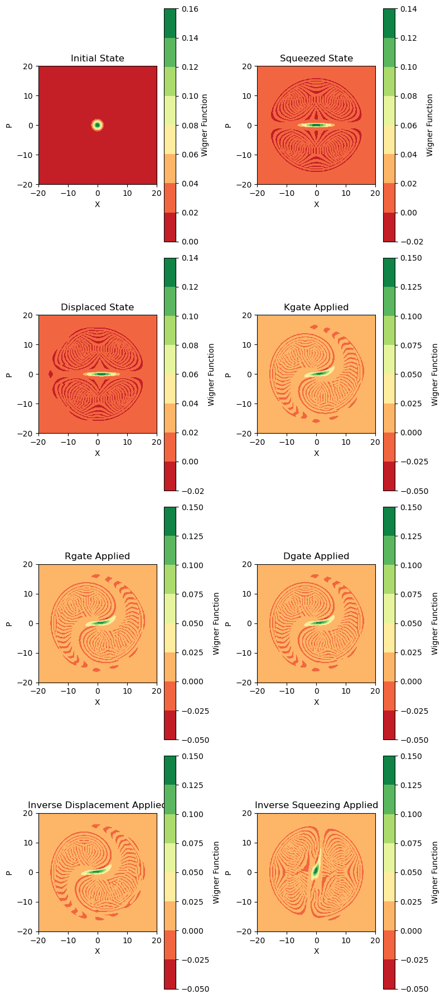

In [ ]:
# Initial state
prog = sf.Program(1)
with prog.context as q:
    Vac | q[0]  # Prepare the vacuum state |0>

eng = sf.Engine('fock', backend_options={"cutoff_dim": cutoff_dim})
state0 = eng.run(prog).state


# Squeezed state
prog = sf.Program(1)
with prog.context as q:
    Vac | q[0]
    Sgate(-np.log(lam), sqphi) | q[0]  # Apply the squeezing

eng = sf.Engine('fock', backend_options={"cutoff_dim": cutoff_dim})
state1 = eng.run(prog).state


# Displaced state
prog = sf.Program(1)
with prog.context as q:
    Vac | q[0]
    Sgate(-np.log(lam), sqphi) | q[0]
    Dgate(rd, phi) | q[0]

eng = sf.Engine('fock', backend_options={"cutoff_dim": cutoff_dim})
state2 = eng.run(prog).state


# Nonlinearity K (split into separate steps)
prog = sf.Program(1)
with prog.context as q:
    Vac | q[0]
    Sgate(-np.log(lam), sqphi) | q[0]
    Dgate(rd, phi) | q[0]

    # Apply nonlinearity in separate steps
    for i in range(N):
        Rgate(-chi/2*dt) | q[0]
        Kgate(nkappa) | q[0]  # Kerr nonlinearity
eng = sf.Engine('fock', backend_options={"cutoff_dim": cutoff_dim})
state3_k = eng.run(prog).state


# Nonlinearity KR (split into separate steps)
prog = sf.Program(1)
with prog.context as q:
    Vac | q[0]
    Sgate(-np.log(lam), sqphi) | q[0]
    Dgate(rd, phi) | q[0]
    
    for i in range(N):
        Rgate(-chi/2*dt) | q[0]
        Kgate(nkappa) | q[0]  # Kerr nonlinearity
        Rgate(nrphi) | q[0]  # Phase rotation
eng = sf.Engine('fock', backend_options={"cutoff_dim": cutoff_dim})
state3_r = eng.run(prog).state


# Nonlinearity KRD (split into separate steps)
prog = sf.Program(1)
with prog.context as q:
    Vac | q[0]
    Sgate(-np.log(lam), sqphi) | q[0]
    Dgate(rd, phi) | q[0]
    
    for i in range(N):
        Rgate(-chi/2*dt) | q[0]
        Kgate(nkappa) | q[0]  # Kerr nonlinearity
        Rgate(nrphi) | q[0]  # Phase rotation
        Dgate(nr, ndphi) | q[0]  # Additional displacement

eng = sf.Engine('fock', backend_options={"cutoff_dim": cutoff_dim})
state3_d = eng.run(prog).state


# inverse displacement
prog = sf.Program(1)
with prog.context as q:
    Vac | q[0] # prepare the vacuum state |0>

    """ Direct """
    Sgate(-np.log(lam), sqphi) | q[0] # apply the squeezing
    Dgate(rd, phi) | q[0] # apply the displacement
    
    """ Nonlinearity """
    for i in range(N): # apply the small propagation step N times
        Rgate(-chi/2*dt) | q[0]
        Kgate(nkappa) | q[0]
        Rgate(nrphi) | q[0]
        Dgate(nr, ndphi) | q[0]
        
    
    """ Inverse """
    Dgate(-rd, phi) | q[0]

eng = sf.Engine('fock', backend_options={"cutoff_dim": cutoff_dim})
state4 = eng.run(prog).state


# inverse squeezing
prog = sf.Program(1)
with prog.context as q:
    Vac | q[0] # prepare the vacuum state |0>

    """ Direct """
    Sgate(-np.log(lam), sqphi) | q[0] # apply the squeezing
    Dgate(rd, phi) | q[0] # apply the displacement
    
    """ Nonlinearity """
    for i in range(N): # apply the small propagation step N times
        Rgate(-chi/2*dt) | q[0]
        Kgate(nkappa) | q[0]
        Rgate(nrphi) | q[0]
        Dgate(nr, ndphi) | q[0]
        
    
    """ Inverse """
    Dgate(-rd, phi) | q[0]
    Sgate(np.log(lam), sqphi) | q[0]
    
eng = sf.Engine('fock', backend_options={"cutoff_dim": cutoff_dim}) 
state5 = eng.run(prog).state


# Plot evolution of the Wigner function in 2D
fig = plt.figure(figsize=(8, 18))

ax1 = fig.add_subplot(421)
ax2 = fig.add_subplot(422)
ax3 = fig.add_subplot(423)
ax4 = fig.add_subplot(424)
ax5 = fig.add_subplot(425)
ax6 = fig.add_subplot(426)
ax7 = fig.add_subplot(427)
ax8 = fig.add_subplot(428)

ax_plot_wigner_2d(ax1, state0, "Initial State")
ax_plot_wigner_2d(ax2, state1, "Squeezed State")
ax_plot_wigner_2d(ax3, state2, "Displaced State")
ax_plot_wigner_2d(ax4, state3_k, "Kgate Applied")
ax_plot_wigner_2d(ax5, state3_r, "Rgate Applied")
ax_plot_wigner_2d(ax6, state3_d, "Dgate Applied")
ax_plot_wigner_2d(ax7, state4, "Inverse Displacement Applied")
ax_plot_wigner_2d(ax8, state5, "Inverse Squeezing Applied")

fig.tight_layout()
plt.show()


#### **Case 1: Instability of Fock Backend When Squeezing States**

When squeezing a state and using the `fock` backend instead of the `gaussian` backend, for high squeezing we get very different results.

Upon looking into this it seems that this is a known issue: 
- [Forum discussion](https://discuss.pennylane.ai/t/wigner-calculation-unstable-for-the-fock-backend/2293/3)

##### Starting with testing the intermediate outcome of our squeezing and displacement:

Parameters: r = 0.7 lam =  3.1622776601683795


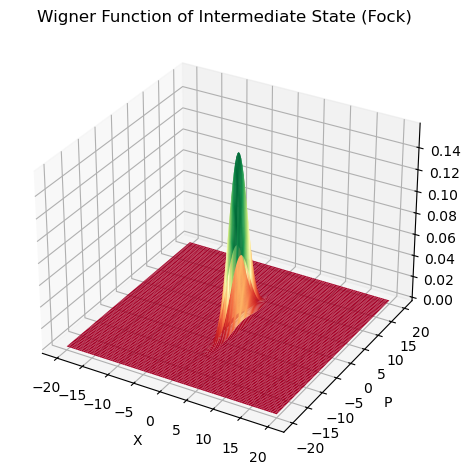

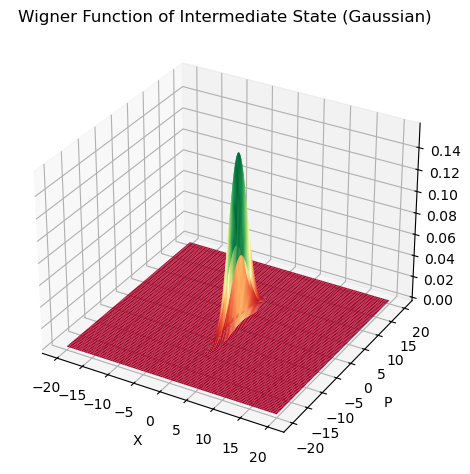

In [8]:
print("Parameters: r =", rd, "lam = ", lam)

prog = sf.Program(1)
with prog.context as q:
    Vac | q[0] # prepare the vacuum state |0>
    
    """ Direct """
    Sgate(np.log(lam), 0) | q[0] # apply the squeezing
    Dgate(rd, phi) | q[0] # apply the displacement
    
    
eng = sf.Engine('fock', backend_options={"cutoff_dim": cutoff_dim}) 
state = eng.run(prog).state
plot_wigner(state, "Wigner Function of Intermediate State (Fock)")


prog = sf.Program(1)
with prog.context as q:
    Vac | q[0] # prepare the vacuum state |0>
    
    """ Direct """
    Sgate(np.log(lam), 0) | q[0] # apply the squeezing
    Dgate(rd, phi) | q[0] # apply the displacement
    
    
eng = sf.Engine('gaussian') 
state = eng.run(prog).state
plot_wigner(state, "Wigner Function of Intermediate State (Gaussian)")

##### **Testing Cutoff Dimension Instability**

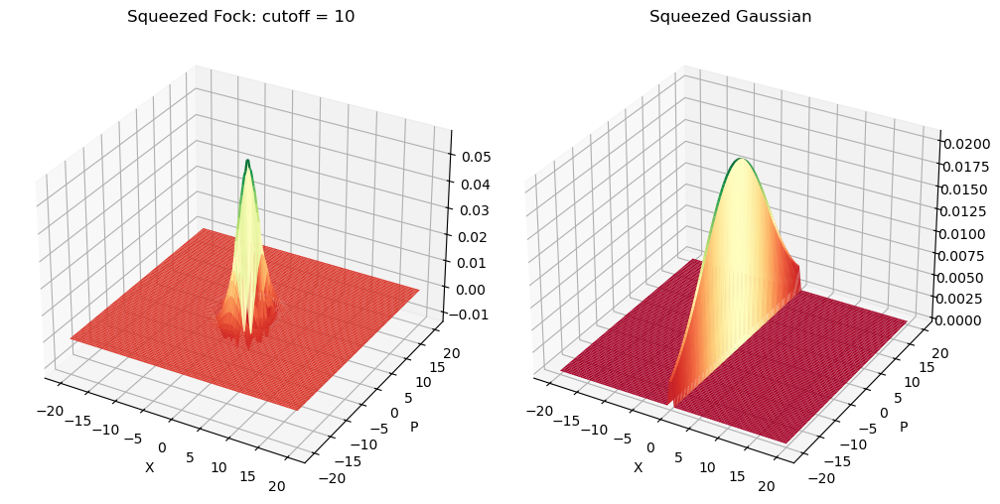

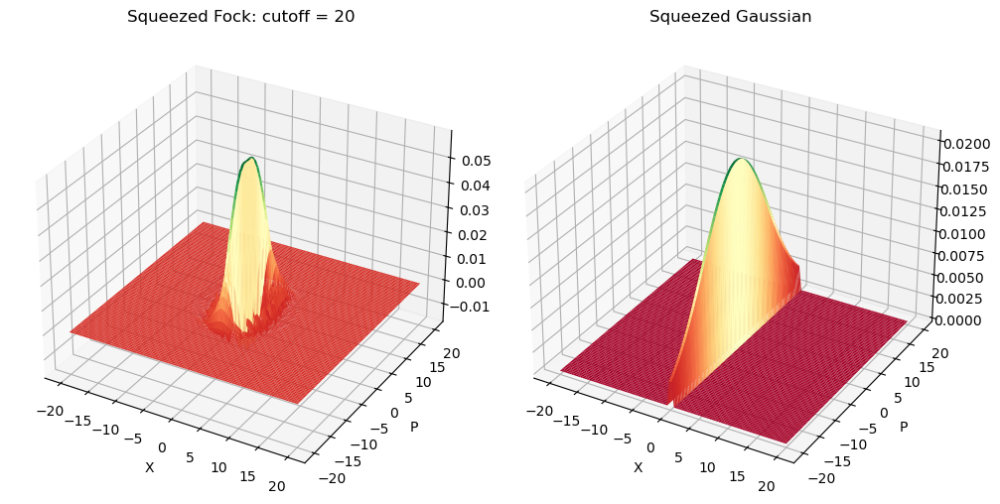

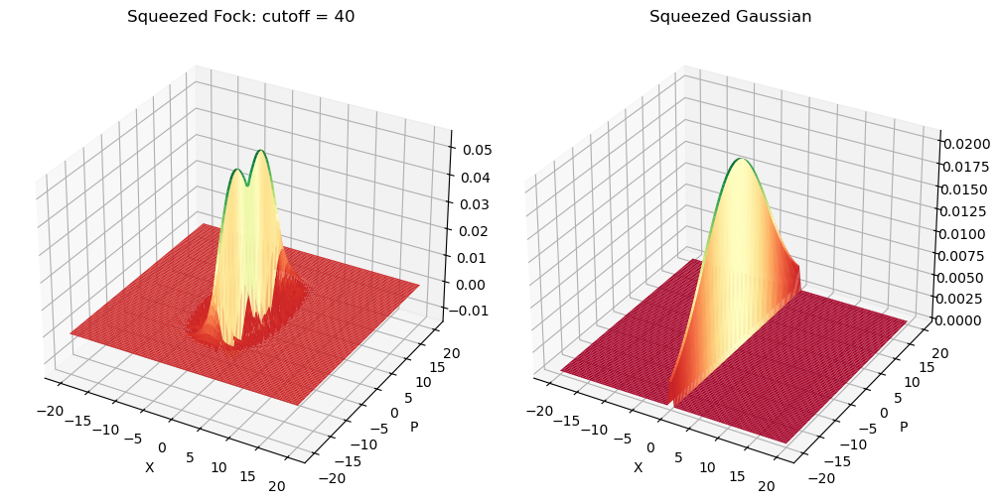

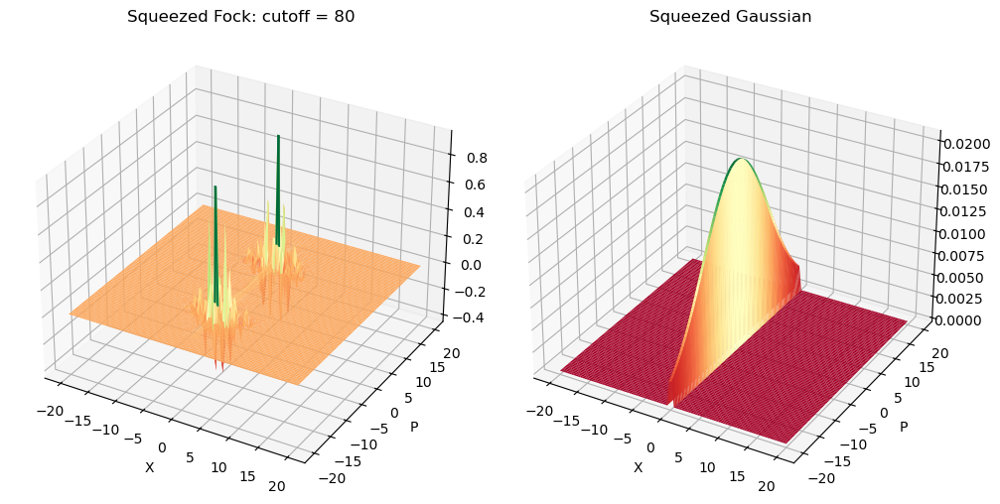

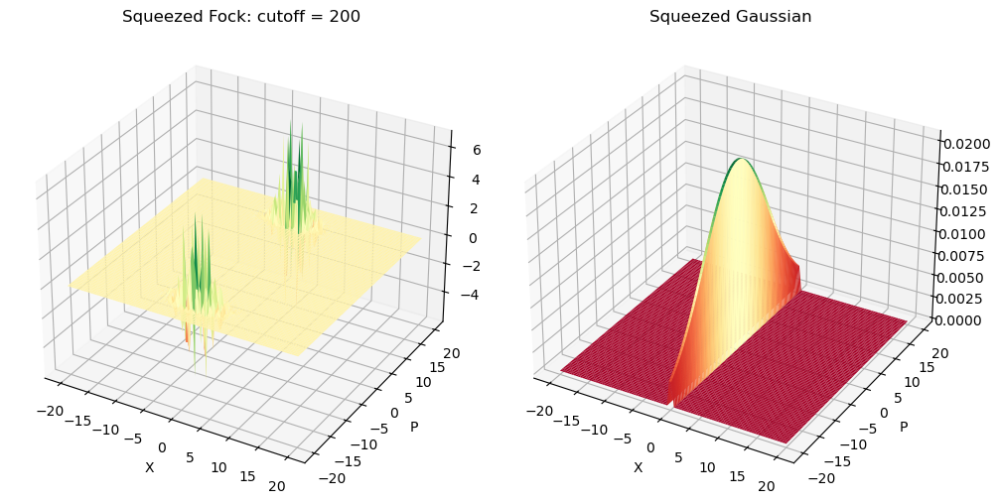

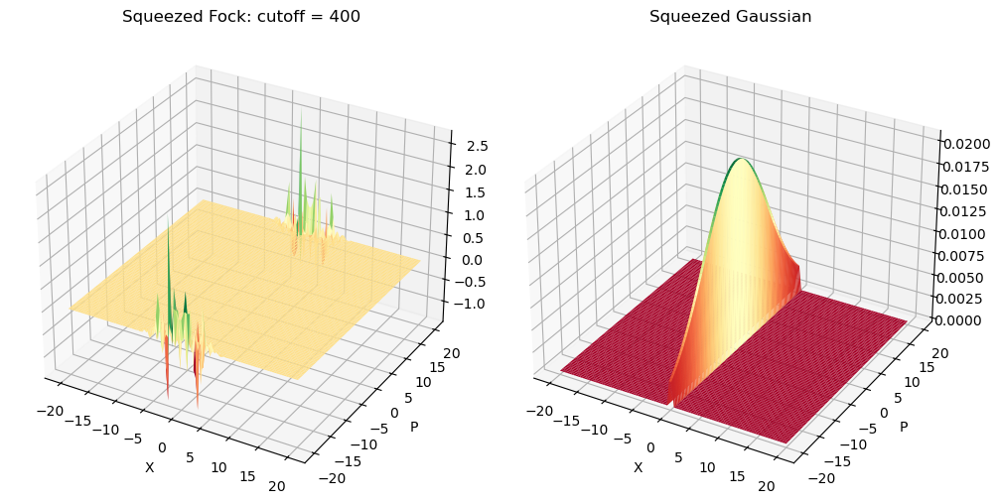

In [9]:
lam = 10.0
cutoff_dim = [10, 20, 40, 80, 200, 400]

def squeeze_fock(lam, cutoff_dim):
    prog = sf.Program(1)
    with prog.context as q:
        Vac | q[0] # prepare the vacuum state |0>

        """ Direct """
        Sgate(np.log(lam), 0) | q[0] # apply the squeezing

    eng = sf.Engine('fock', backend_options={"cutoff_dim": cutoff_dim}) 
    state = eng.run(prog).state
    return state

def squeeze_gaussian(lam, cutoff_dim):
    prog = sf.Program(1)
    with prog.context as q:
        Vac | q[0] # prepare the vacuum state |0>

        """ Direct """
        Sgate(np.log(lam), 0) | q[0] # apply the squeezing

    eng = sf.Engine('gaussian') 
    state = eng.run(prog).state
    return state

for i in range(len(cutoff_dim)):
    squeezedf = squeeze_fock(lam, cutoff_dim[i])
    squeezedg = squeeze_gaussian(lam, cutoff_dim[i])

    fig = plt.figure(figsize=(10, 5)) 
    ax1 = fig.add_subplot(121, projection='3d')
    ax2 = fig.add_subplot(122, projection='3d')
    ax_plot_wigner(ax1, squeezedf, "Squeezed Fock: cutoff = " + str(cutoff_dim[i]))
    ax_plot_wigner(ax2, squeezedg, "Squeezed Gaussian")
    fig.tight_layout()
    plt.show()

##### **Testing Range of Representable Squeezing**

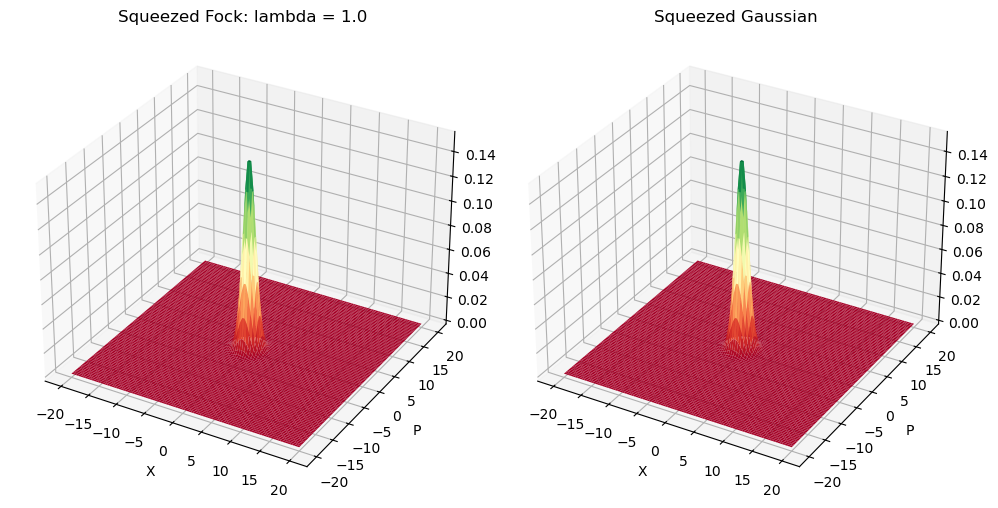

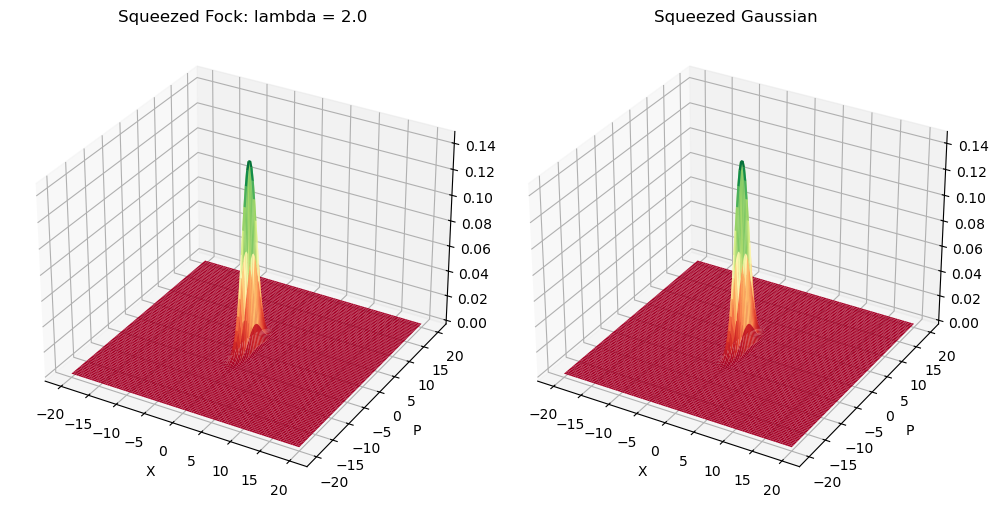

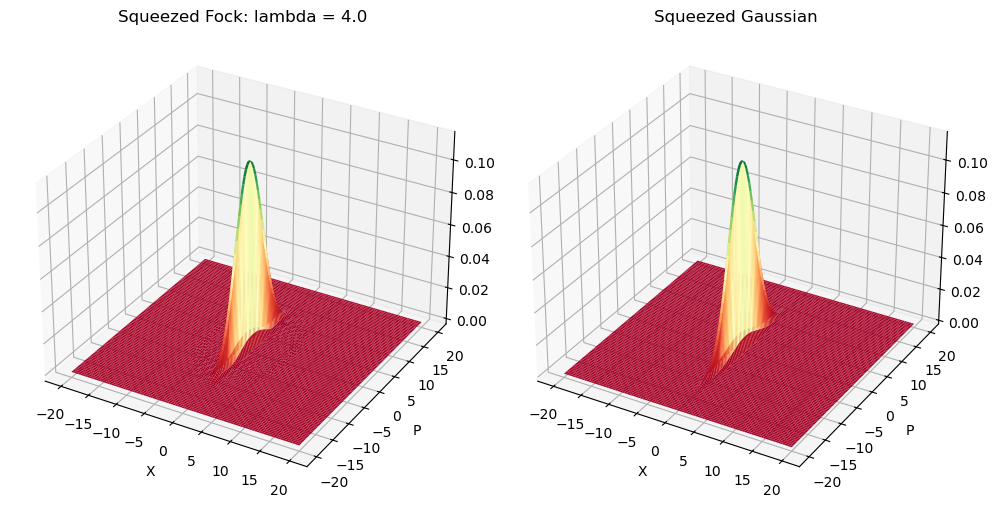

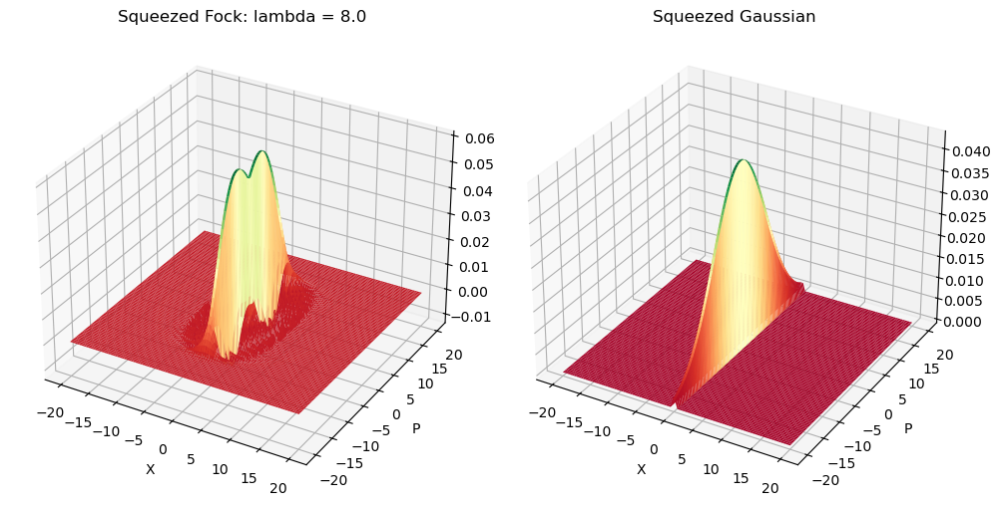

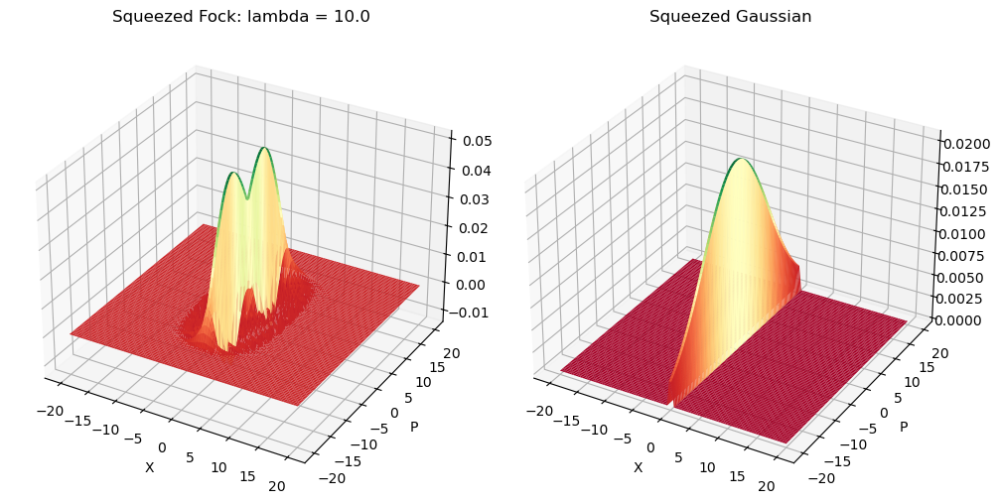

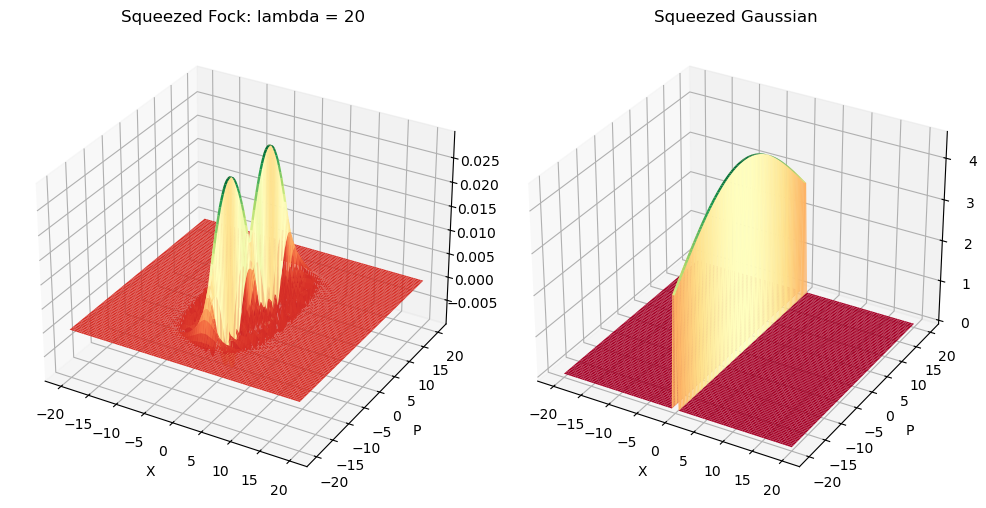

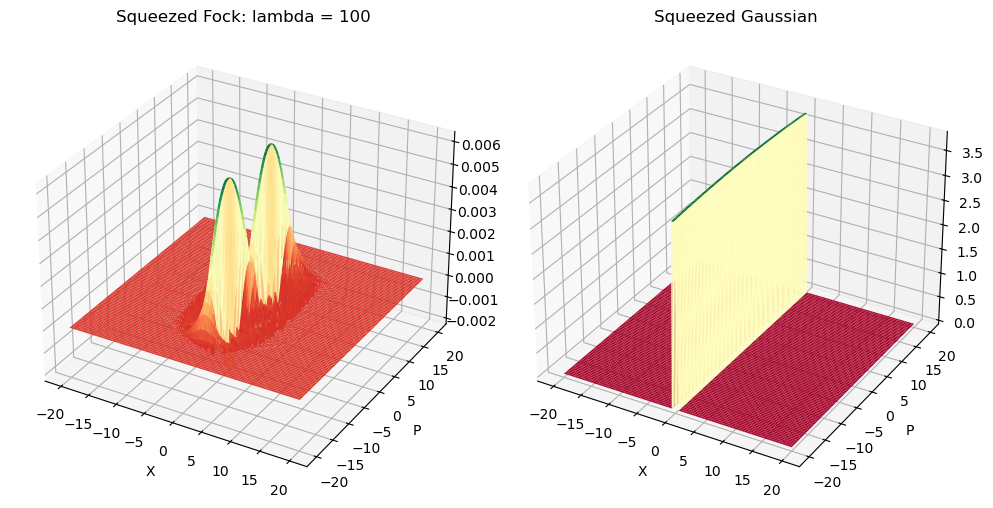

In [ ]:
squeezing = [1.0, 2.0, 4.0, 8.0, 10.0, 20, 100]
cutoff_dim = 50

def squeeze_fock(lam, cutoff_dim):
    prog = sf.Program(1)
    with prog.context as q:
        Vac | q[0] # prepare the vacuum state |0>

        """ Direct """
        Sgate(np.log(lam), 0) | q[0] # apply the squeezing

    eng = sf.Engine('fock', backend_options={"cutoff_dim": cutoff_dim}) 
    state = eng.run(prog).state
    return state

def squeeze_gaussian(lam):
    prog = sf.Program(1)
    with prog.context as q:
        Vac | q[0] # prepare the vacuum state |0>

        """ Direct """
        Sgate(np.log(lam), 0) | q[0] # apply the squeezing

    eng = sf.Engine('gaussian') 
    state = eng.run(prog).state
    return state

for i in range(len(squeezing)):
    squeezedf = squeeze_fock(squeezing[i], cutoff_dim)
    squeezedg = squeeze_gaussian(squeezing[i])

    fig = plt.figure(figsize=(10, 5)) 
    ax1 = fig.add_subplot(121, projection='3d')
    ax2 = fig.add_subplot(122, projection='3d')
    ax_plot_wigner(ax1, squeezedf, "Squeezed Fock: lambda = " + str(squeezing[i]))
    ax_plot_wigner(ax2, squeezedg, "Squeezed Gaussian")
    fig.tight_layout()
    plt.show()

##### **Testing displacement ranges**

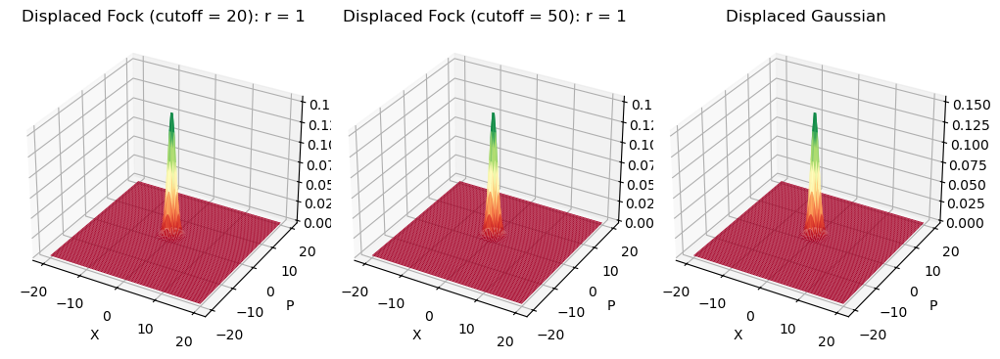

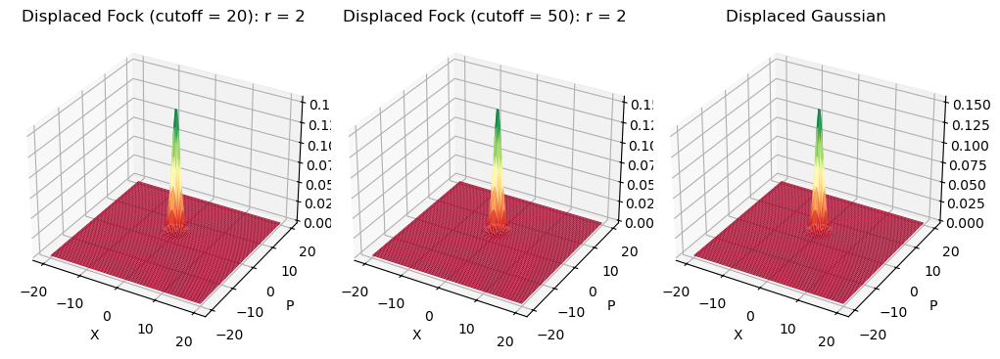

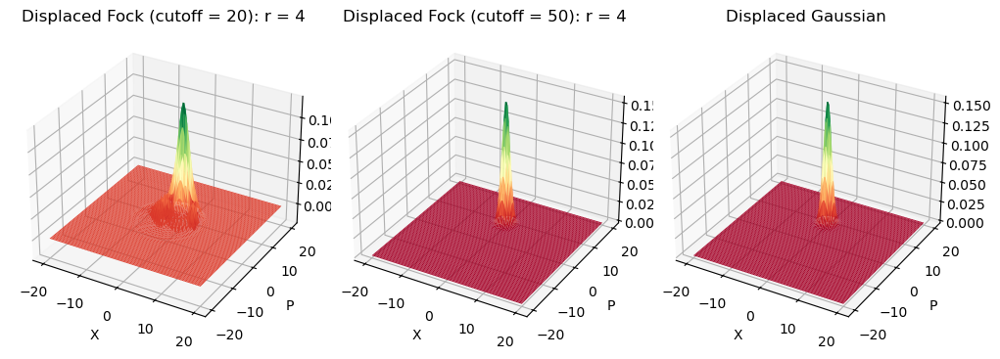

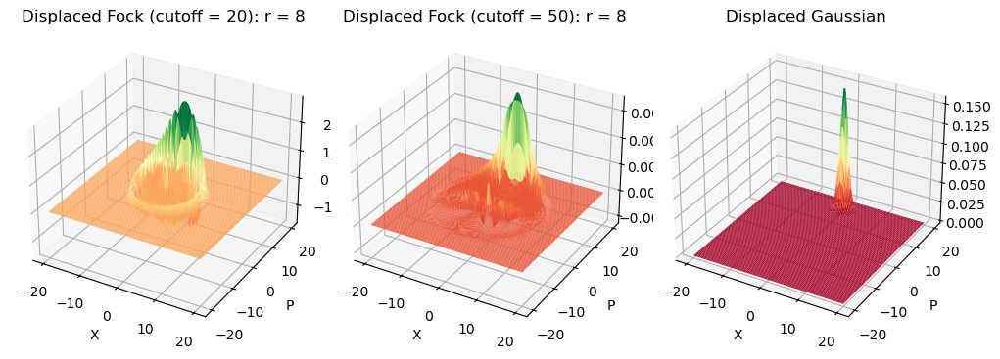

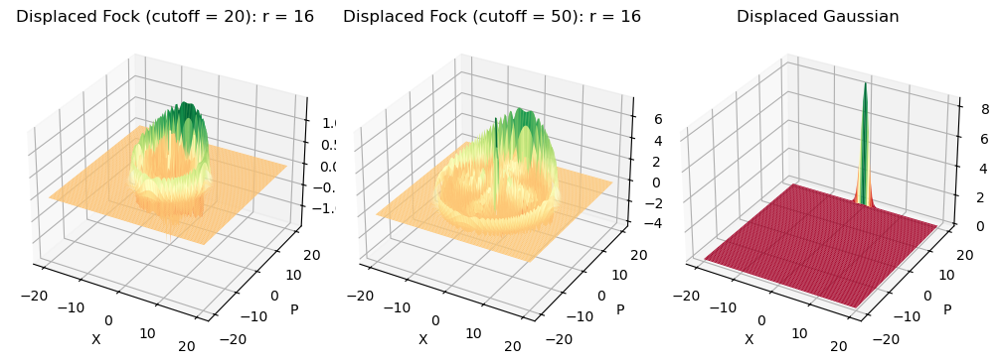

In [ ]:
displacement = [1, 2, 4, 8, 16]

def displace_fock20(r, phi):
    prog = sf.Program(1)
    with prog.context as q:
        Vac | q[0] # prepare the vacuum state |0>

        """ Direct """
        Dgate(r, phi) | q[0] # apply the displacement

    eng = sf.Engine('fock', backend_options={"cutoff_dim": 20}) 
    state = eng.run(prog).state
    return state

def displace_fock50(r, phi):
    prog = sf.Program(1)
    with prog.context as q:
        Vac | q[0] # prepare the vacuum state |0>

        """ Direct """
        Dgate(r, phi) | q[0] # apply the displacement

    eng = sf.Engine('fock', backend_options={"cutoff_dim": 50}) 
    state = eng.run(prog).state
    return state

def displace_gaussian(r, phi):
    prog = sf.Program(1)
    with prog.context as q:
        Vac | q[0] # prepare the vacuum state |0>

        """ Direct """
        Dgate(r, phi) | q[0] # apply the displacement

    eng = sf.Engine('gaussian') 
    state = eng.run(prog).state
    return state

for i in range(len(displacement)):
    displacedf20 = displace_fock20(displacement[i], np.pi/2)
    displacedf50 = displace_fock50(displacement[i], np.pi/2)
    displacedg = displace_gaussian(displacement[i], np.pi/2)

    fig = plt.figure(figsize=(10, 5)) 
    ax1 = fig.add_subplot(131, projection='3d')
    ax2 = fig.add_subplot(132, projection='3d')
    ax3 = fig.add_subplot(133, projection='3d')
    ax_plot_wigner(ax1, displacedf20, "Displaced Fock (cutoff = 20): r = " + str(displacement[i]))
    ax_plot_wigner(ax2, displacedf50, "Displaced Fock (cutoff = 50): r = " + str(displacement[i]))
    ax_plot_wigner(ax3, displacedg, "Displaced Gaussian")

    fig.tight_layout()
    plt.show()

#### **Case 2: Difference in `fock` and `tf` Backends**

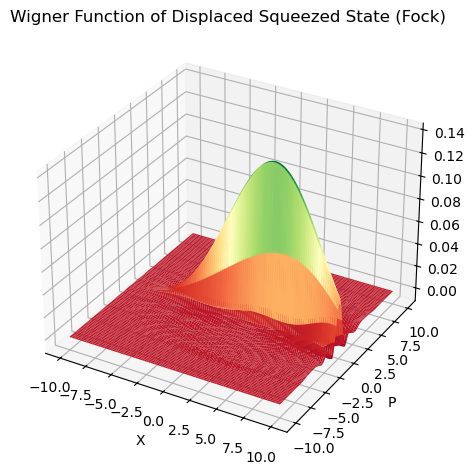

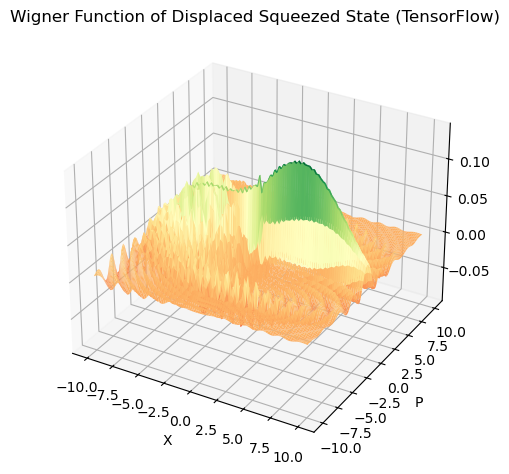

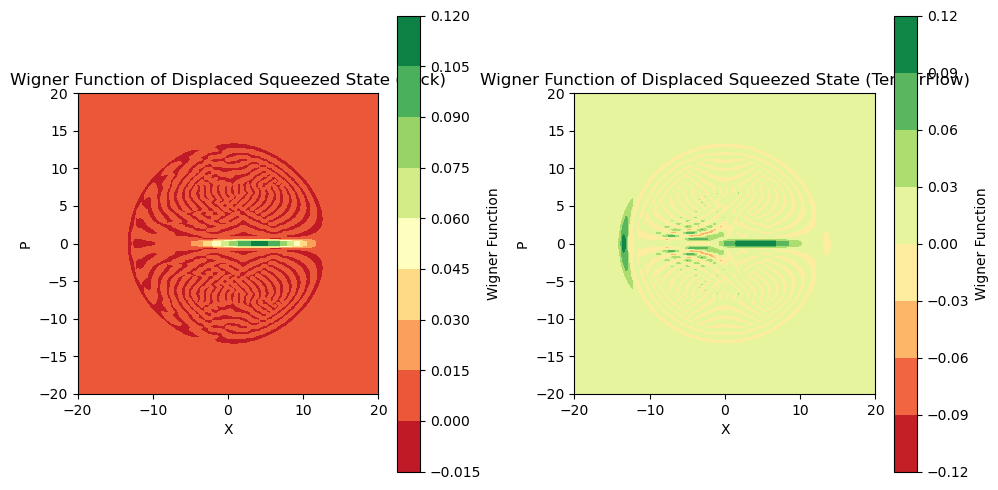

In [ ]:
prog = sf.Program(1)
with prog.context as q:
    Vac | q[0] # prepare the vacuum state |0>

    Sgate(-1.5, 0) | q[0] # apply squeezing
    Dgate(2, phi) | q[0] # apply displacement
fock_eng = sf.Engine('fock', backend_options={"cutoff_dim": 50})
tfeng = sf.Engine('tf', backend_options={"cutoff_dim": 50})
#tfgaus = sf.Engine('gaussian')

statefock = fock_eng.run(prog).state
statetf = tfeng.run(prog).state
#stategaus = tfgaus.run(prog).state

plot_wigner(statefock, "Wigner Function of Displaced Squeezed State (Fock)", range = 10)
plot_wigner(statetf, "Wigner Function of Displaced Squeezed State (TensorFlow)", range = 10)
#plot_wigner(stategaus, "Wigner Function of Displaced Squeezed State (Gaussian)", range = 10)

# plot_wigner_2d(statefock, "Wigner Function of Displaced Squeezed State (Fock)", range = 10)
# plot_wigner_2d(statetf, "Wigner Function of Displaced Squeezed State (TensorFlow)", range = 10)
# plot_wigner_2d(stategaus, "Wigner Function of Displaced Squeezed State (Gaussian)", range = 10)


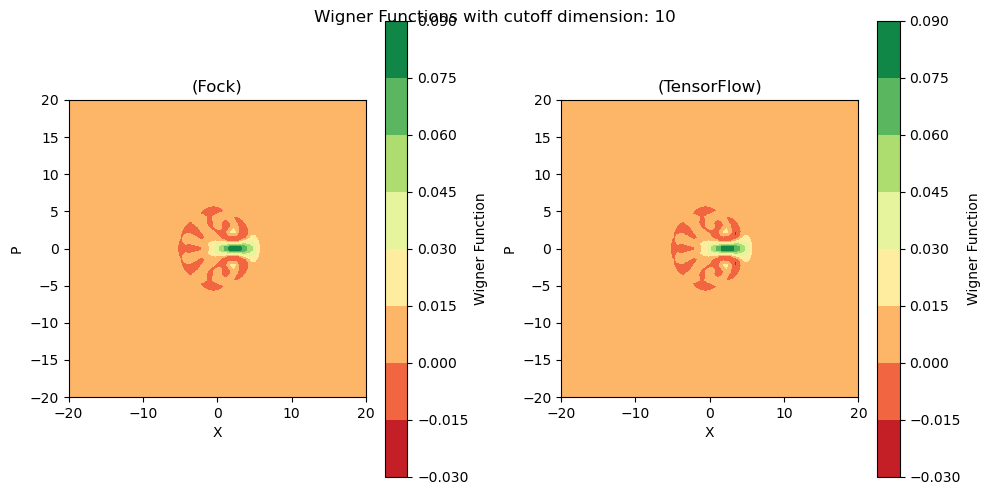

Error =  0.6269306619123891


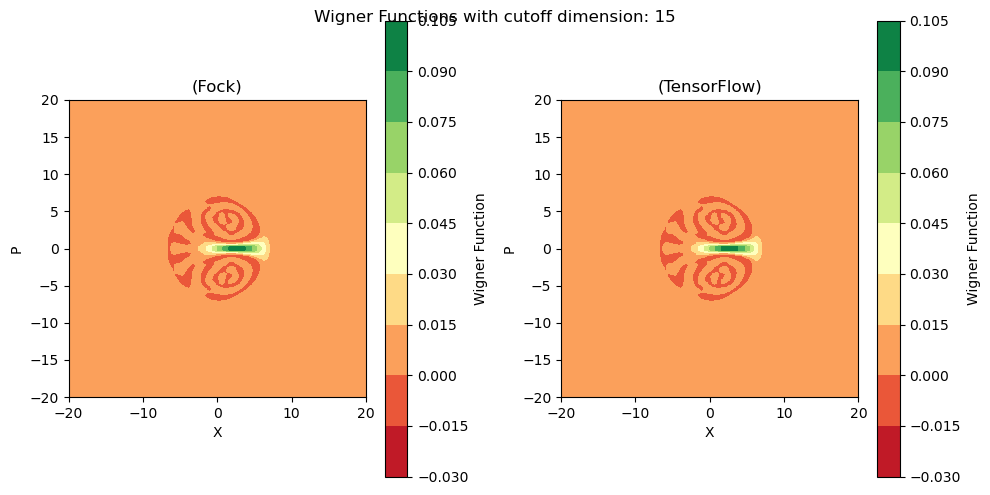

Error =  0.42909736402671583


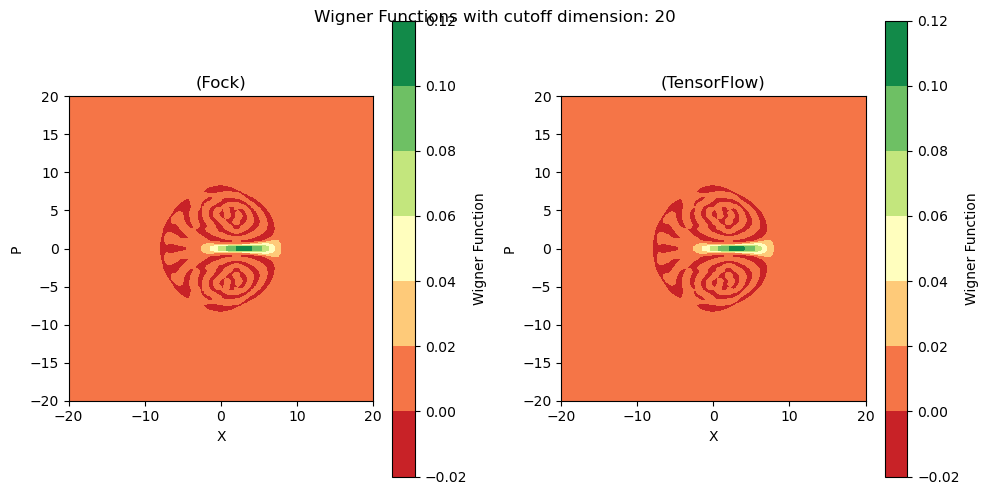

Error =  0.2962780044167985


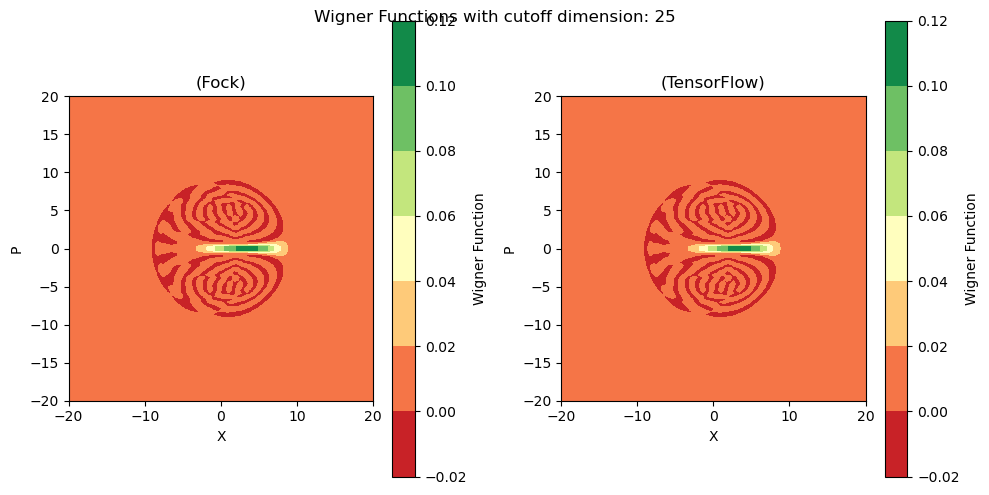

Error =  0.19371638625975218


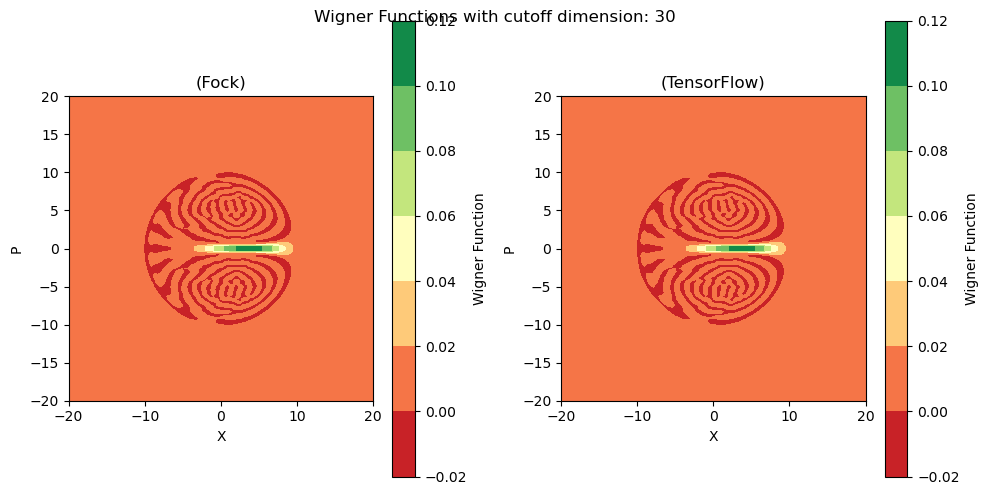

Error =  0.13127834702741348


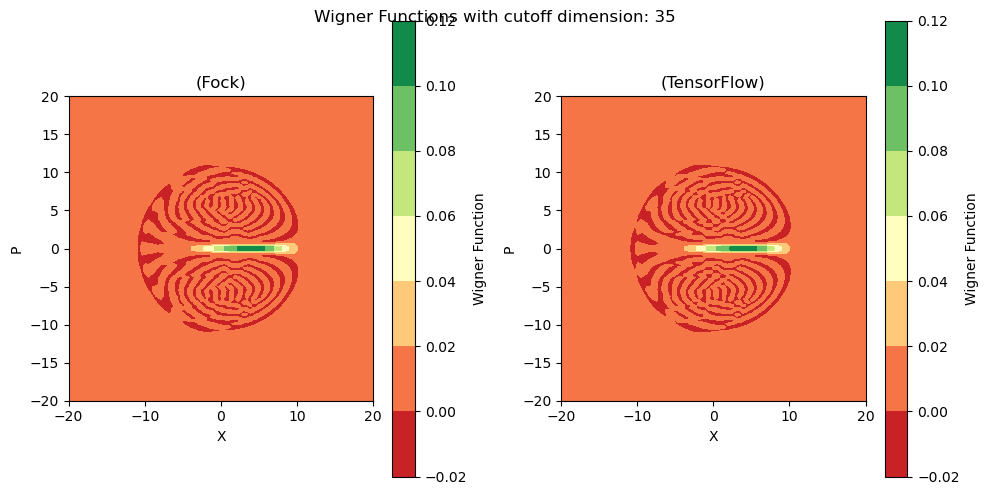

Error =  0.08581304784620558


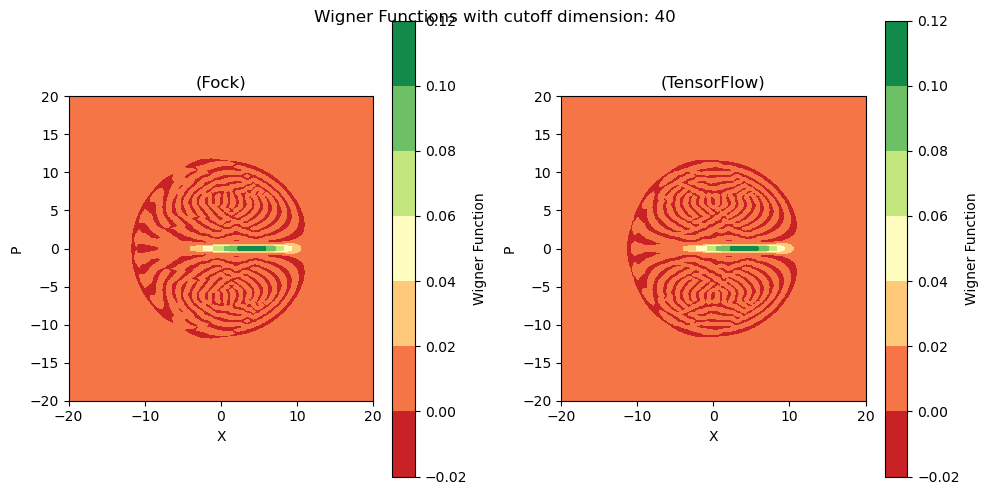

Error =  0.0591307060492996


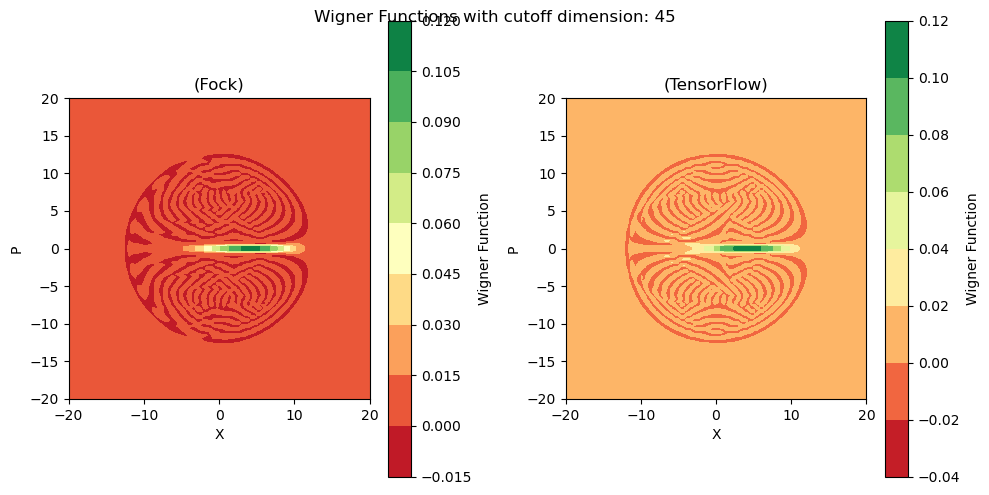

Error =  0.03182706768035071


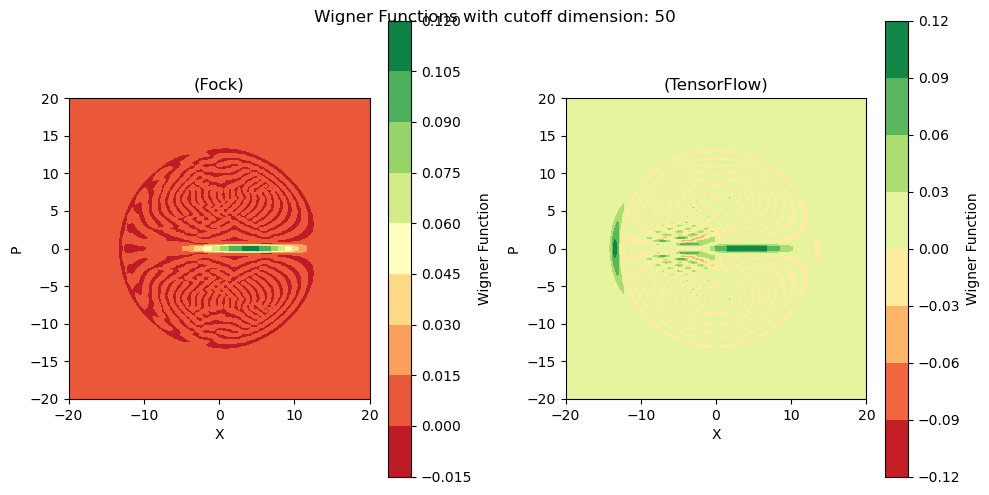

Error =  0.04193034797280981


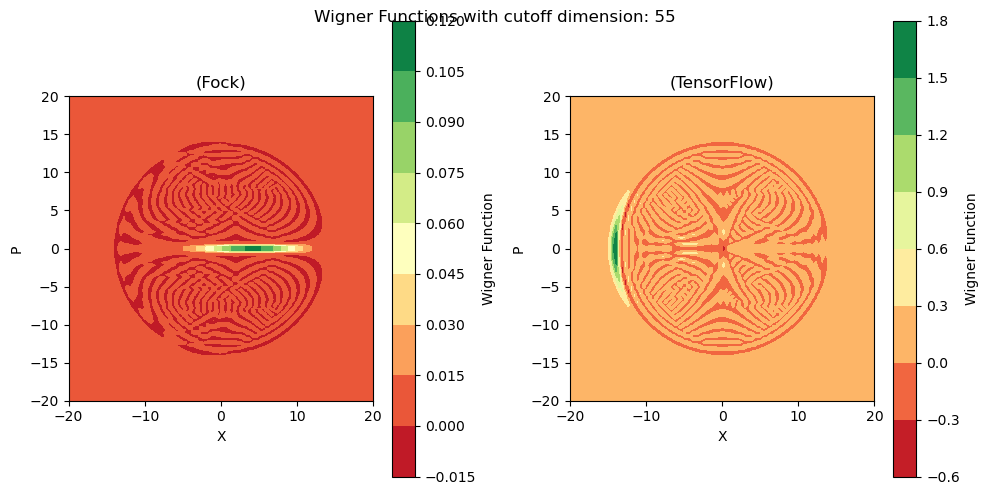

Error =  -0.036908103387721214


In [40]:
def run_test(cutoff_dim):
    prog = sf.Program(1)
    with prog.context as q:
        Vac | q[0] # prepare the vacuum state |0>

        Sgate(-1.5, 0) | q[0] # apply squeezing
        Dgate(2, phi) | q[0] # apply displacement
    fock_eng = sf.Engine('fock', backend_options={"cutoff_dim": cutoff_dim})
    tfeng = sf.Engine('tf', backend_options={"cutoff_dim": cutoff_dim})
    
    statefock = fock_eng.run(prog).state
    statetf = tfeng.run(prog).state
    
    # plot wigner function on same plot
    fig = plt.figure(figsize = (10, 5))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    ax_plot_wigner_2d(ax1, statefock, "(Fock)", range = 20)
    ax_plot_wigner_2d(ax2, statetf, "(TensorFlow)", range = 20)
    plt.tight_layout()
    plt.suptitle("Wigner Functions with cutoff dimension: {}".format(cutoff_dim))
    plt.show()
    
    print("Error = ", 1 - statefock.fidelity(other_state = statetf.ket(), mode = 0))

for cutoff in range(10, 60, 5):
    run_test(cutoff_dim = cutoff)

the behavior above can sometimes be observed when using higher cutoff dimensions for the `tf`basis

#### **Case 3: Commutativity of Nonlinear Operations**

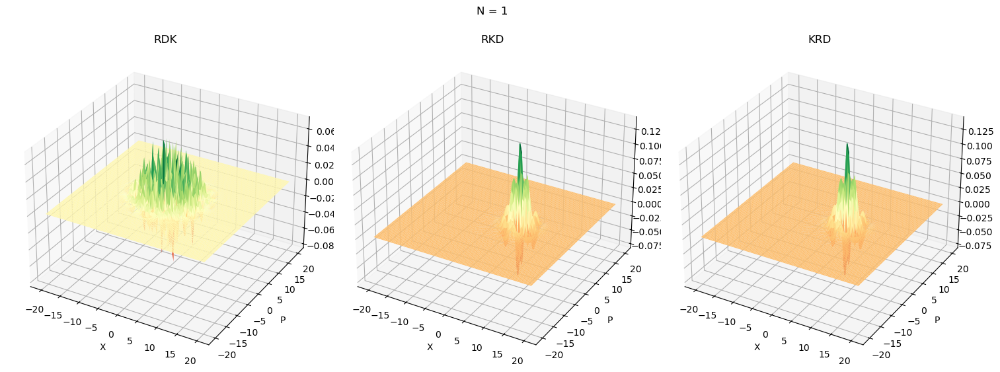

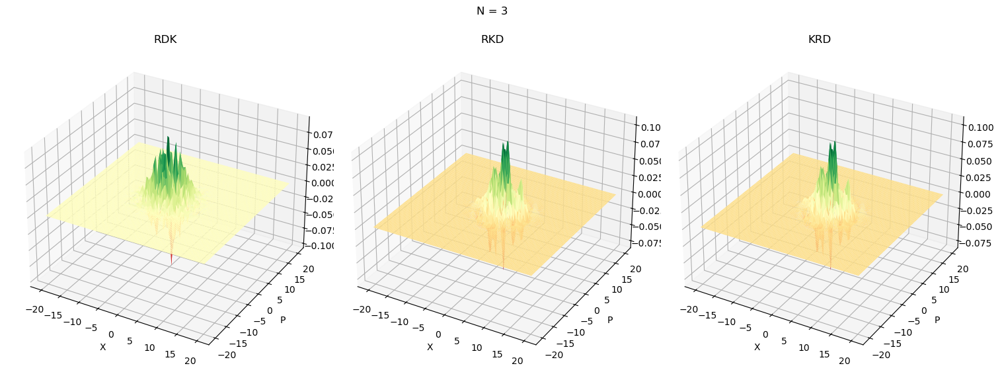

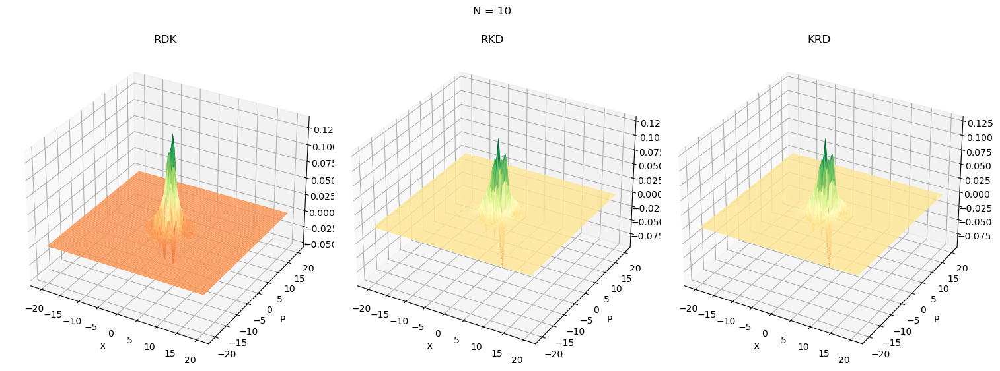

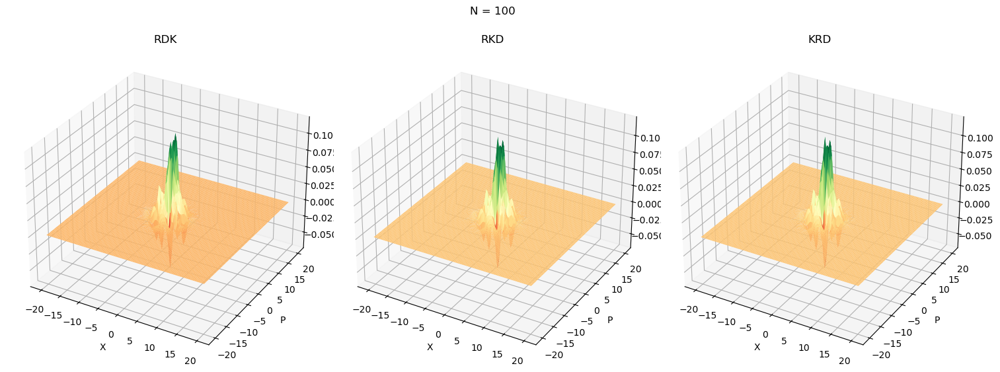

In [134]:
# setup operators
def rotation(delta):
    return Rgate(np.pi / 2 * delta)

def displacement(delta):
    return Dgate(3 * delta, 0)

def nonlinearity(delta):
    return Kgate(5 * delta)

start_state = sf.ops.GKP([0, 0])



# test
N = 100


def test(N):
    delta = 1 / N
    prog = sf.Program(1)
    with prog.context as q:
        start_state | q[0] # prepare the vacuum state |0>
        
        for i in range(N):
            rotation(delta) | q[0]
            displacement(delta) | q[0]
            nonlinearity(delta) | q[0]

    eng = sf.Engine('fock', backend_options={"cutoff_dim": 40})
    stateRDK = eng.run(prog).state

    prog = sf.Program(1)
    with prog.context as q:
        start_state | q[0] # prepare the vacuum state |0>
        
        for i in range(N):
            rotation(delta) | q[0]
            nonlinearity(delta) | q[0]
            displacement(delta) | q[0]
        
        
    eng = sf.Engine('fock', backend_options={"cutoff_dim": 40})
    stateRKD = eng.run(prog).state


    prog = sf.Program(1)
    with prog.context as q:
        start_state | q[0] # prepare the vacuum state |0>
        
        for i in range(N):
            nonlinearity(delta) | q[0]
            rotation(delta) | q[0]
            displacement(delta) | q[0]
    eng = sf.Engine('fock', backend_options={"cutoff_dim": 40})
    stateKRD = eng.run(prog).state

    # plot
    fig = plt.figure(figsize=(15, 6))
    fig.suptitle("N = {}".format(N))
    ax1 = fig.add_subplot(131, projection='3d')
    ax2 = fig.add_subplot(132, projection='3d')
    ax3 = fig.add_subplot(133, projection='3d')
    ax_plot_wigner(ax1, stateRDK, "RDK")
    ax_plot_wigner(ax2, stateRKD, "RKD")
    ax_plot_wigner(ax3, stateKRD, "KRD")
    plt.tight_layout()
    plt.show()
    
test(1)
test(3)
test(10)
test(100)


Therefore the order of operations and the "discretization" of the operations matters for our chosen operators.

#### **Conclusions:**
1) Increasing the `cutoff_dim` for the `fock` basis leads to larger representable displacement values $\alpha$, but may lead to quicker numerical instability for highly squeezed states.
2) A `cutoff_dim` of 50 does not yet have a numerical isntability and is able to represent dispacements as large as $r = 4$, and squeezing as large as $\lambda = 4$ (these limits could be made more precise). This could be etiher from the fock basis not being able to represent highly squeezed or displaced states (most likely) or from the operations being unstable in squeezing or displacing in the fock basis.
3) The `tf` backend experiences numerical instability "quicker", that is, with lower values of `cutoff_dimension`. (it is more susceptible to it)

### **Questions**

1) What are the expected/typical displacement and squeezing parameters $\alpha$, $\lambda$
2) Is Kerr gate really representative of the nonlinearity in the driven Kerr Hamiltonian?
3) What is a typical value for Kerr nonlinearity $\chi$

- It seems like changing `N` - discretization order, doesn't affect outcome